# Part1

# 1.Import and warehouse data:
## Import all the given datasets and explore shape and size. 

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats

In [2]:
df = pd.read_csv("Part1 - Car name.csv")
df1 = pd.read_json("Part1 - Car-Attributes.json")
#In part 1 project only df and df1 is required
df2 = pd.read_excel("Part2 - Company.xlsx")
df3 = pd.read_csv("Part3 - vehicle.csv")
df4 = pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")

In [3]:
def shape(x):
    print(f"The shape is {x.shape} and size is {x.size}")

In [4]:
shape(df)
# we have the car names- matching with the number of rows in df1

The shape is (398, 1) and size is 398


In [5]:
shape(df1)

The shape is (398, 8) and size is 3184


## Merge all datasets onto one and explore final shape and size

In [6]:
df = pd.concat([df,df1],axis=1)

In [7]:
shape(df)
#Post concatenating we have a total of 9 columns and 398 rows

The shape is (398, 9) and size is 3582


## Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.

In [8]:
df.to_csv('Part1.csv',index=False)
df.to_excel('Part1.xlsx',index=False)
df.to_json('Part1.json')

## Import the data from above steps into python.

In [9]:
a = pd.read_csv('Part1.csv')
b = pd.read_json('Part1.json')
c = pd.read_excel('Part1.xlsx')

In [10]:
l = [shape(n) for n in [a,b,c]]

The shape is (398, 9) and size is 3582
The shape is (398, 9) and size is 3582
The shape is (398, 9) and size is 3582


# 2.Data cleansing:

## Missing/incorrect value treatment

In [11]:
df.isnull().sum()
#this shows there is no missing values

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [12]:
df.info()
#But the hp column is an object which is strange as hp is a numerical value and if it has object, there must be some
#string

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [13]:
df.describe()
#we check for 5 point summary

,mpg,cyl,disp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='mpg', ylabel='Density'>

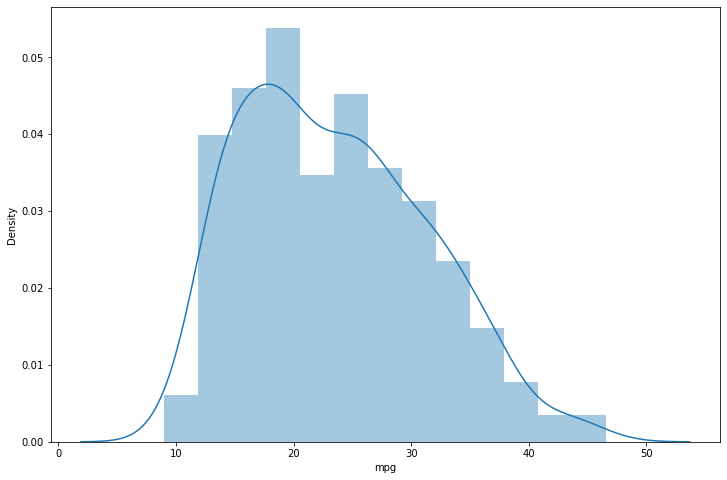

In [14]:
plt.figure(figsize=(12,8))
sns.distplot(df['mpg'])
#A continuous number which is skewed on the right

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='mpg'>

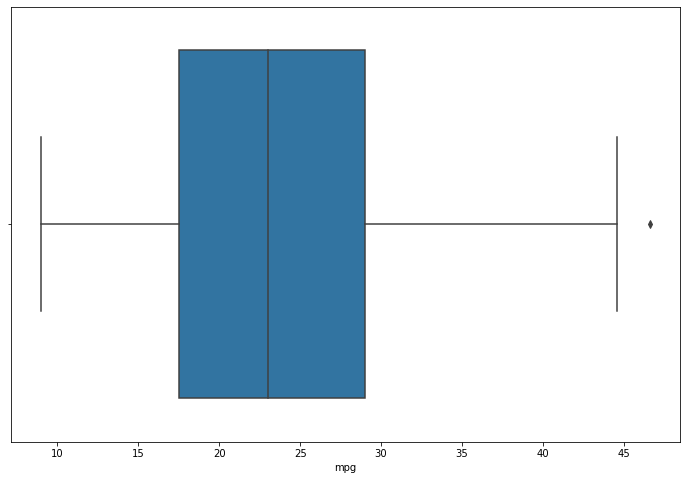

In [15]:
plt.figure(figsize=(12,8))
sns.boxplot(df['mpg'])
#We see an outlier but it is just 1 point

In [16]:
df['cyl'].unique()
#Cyclinder seems to be a discrete number but it is mostly an ordinal datatype, we will see this in detail in univariate
#and multivariate analysis

array([8, 4, 6, 3, 5], dtype=int64)

In [17]:
df.groupby('cyl')['mpg'].mean()
#With the increase in cylinder there is decrease in mpg. The increase in cylinder always ends up giving a good
# performance output which ultimately reduces the mileage.

cyl
3    20.550000
4    29.286765
5    27.366667
6    19.985714
8    14.963107
Name: mpg, dtype: float64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='disp', ylabel='Density'>

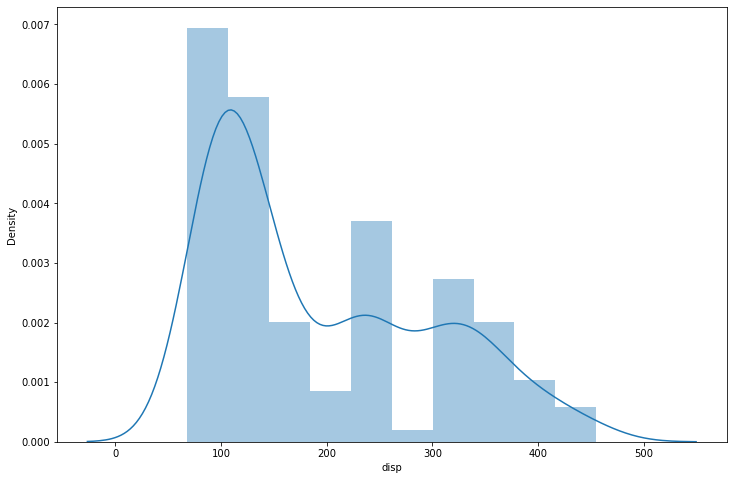

In [18]:
plt.figure(figsize=(12,8))
sns.distplot(df['disp'])
#Data seems to be skewed here and also is not normally distributed. It  is a multimodal distribution.

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='disp'>

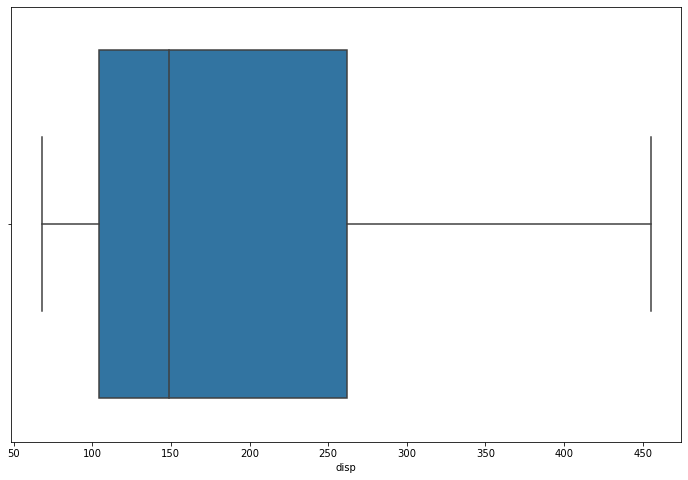

In [19]:
plt.figure(figsize=(12,8))
sns.boxplot(df['disp'])
#We dont see outliers

In [20]:
df['hp'].apply(float)
#HP datatype is an object, so this clearly tells there is some string present. In order to sort this out we try to 
#apply float method on the data. We notice that HP column contains ? in it which is actually a missing value.

ValueError: could not convert string to float: '?'

In [21]:
def hp(x):
    try:
        df['hp'].apply(float)
    except ValueError:
        if x == '?':
            return np.nan
        else:
            return float(x)

# We fill in the ? with np.nan

In [22]:
df['hp'] = df['hp'].apply(hp)

In [23]:
df.isnull().sum()
#Now, we notice there are 6 missing rows for hp so these missing values need to be imputed

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='wt', ylabel='Density'>

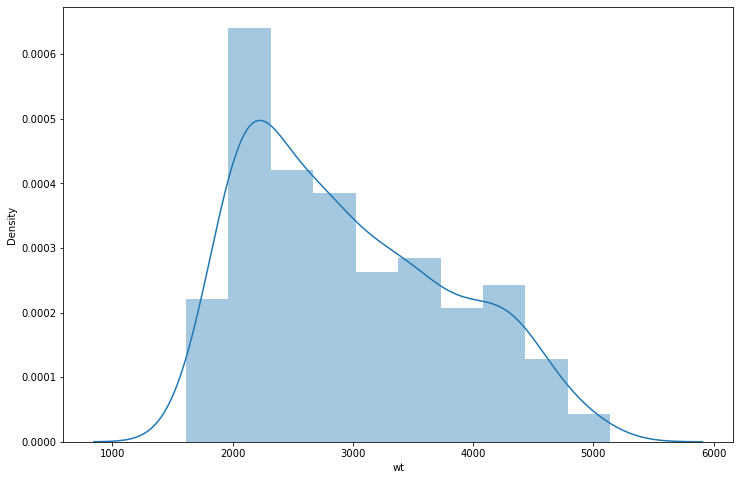

In [24]:
plt.figure(figsize=(12,8))
sns.distplot(df['wt'])
#data is skewed and bimodal

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='wt'>

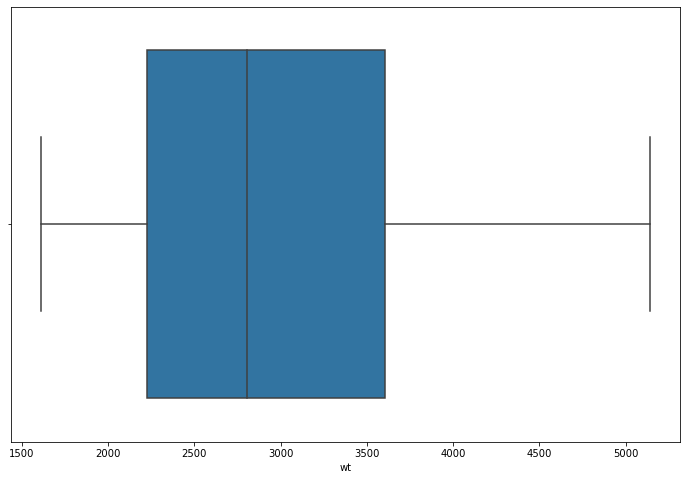

In [25]:
plt.figure(figsize=(12,8))
sns.boxplot(df['wt'])
# We dont see outliers

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='acc', ylabel='Density'>

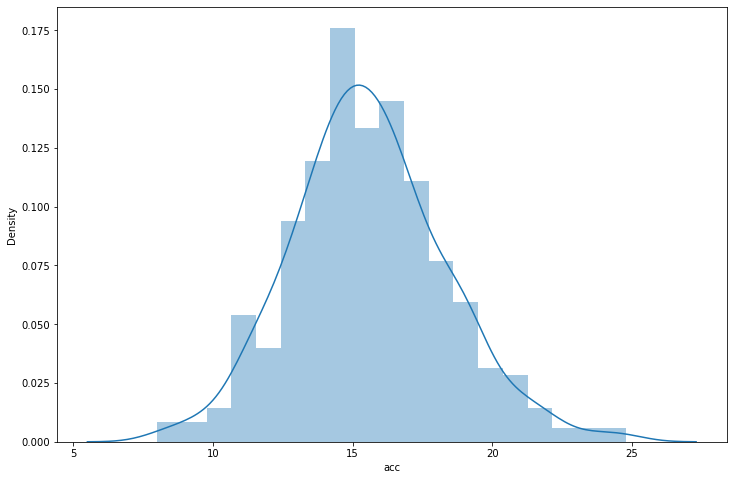

In [26]:
plt.figure(figsize=(12,8))
sns.distplot(df['acc'])
#This data is normally distributed

In [27]:
df['acc'].describe()

count    398.000000
mean      15.568090
std        2.757689
min        8.000000
25%       13.825000
50%       15.500000
75%       17.175000
max       24.800000
Name: acc, dtype: float64

In [28]:
df['acc'].mean()

#The mean and median are almost the same for accelaration, in a perfectly normal distribution mean,median 
# and mode is same

15.568090452261291

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='acc'>

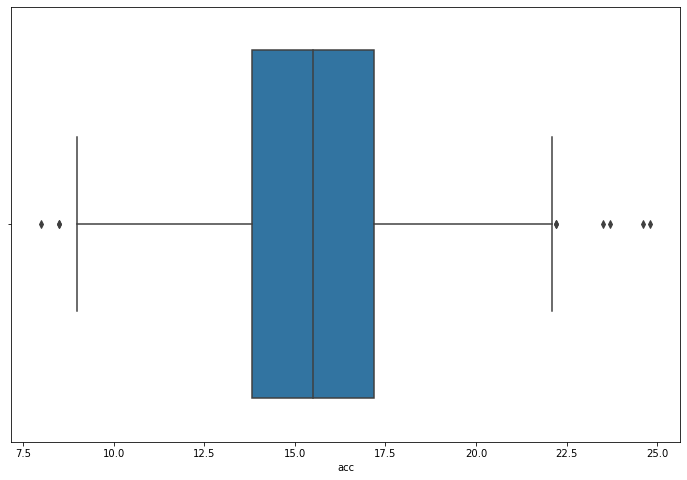

In [29]:
plt.figure(figsize=(12,8))
sns.boxplot(df['acc'])
#Strangely we do see some outliers

In [30]:
df['yr'].unique()

array([70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82], dtype=int64)

In [31]:
n = df['car_name'].apply(lambda x: x.split()[0])
#We try pulling the brand name to see if we can use these to create an ordinal data but ends up being not useful so we
#neglect this brand name or car name

In [32]:
df['origin'].unique()
#Discrete data, origin is mostly the country from where cars are made

array([1, 3, 2], dtype=int64)

# Except HP the other features do not have any missing values - we will see what is the correlating feature for hp

In [33]:
df.corr()['hp'].sort_values(ascending=False)
#Displacement, weight and cylinder seems to be a good feature to fill hp

hp        1.000000
disp      0.897257
wt        0.864538
cyl       0.842983
yr       -0.416361
origin   -0.455171
acc      -0.689196
mpg      -0.778427
Name: hp, dtype: float64

In [34]:
df.corr()

,mpg,cyl,disp,hp,wt,acc,yr,origin
mpg,1.000000,-0.775396,-0.804203,-0.778427,-0.831741,0.420289,0.579267,0.563450
cyl,-0.775396,1.000000,0.950721,0.842983,0.896017,-0.505419,-0.348746,-0.562543
disp,-0.804203,0.950721,1.000000,0.897257,0.932824,-0.543684,-0.370164,-0.609409
hp,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361,-0.455171
wt,-0.831741,0.896017,0.932824,0.864538,1.000000,-0.417457,-0.306564,-0.581024
acc,0.420289,-0.505419,-0.543684,-0.689196,-0.417457,1.000000,0.288137,0.205873
yr,0.579267,-0.348746,-0.370164,-0.416361,-0.306564,0.288137,1.000000,0.180662
origin,0.563450,-0.562543,-0.609409,-0.455171,-0.581024,0.205873,0.180662,1.000000


In [35]:
from sklearn.linear_model import LinearRegression
import pickle
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
#We try linear model to impute values and also KNN regressor

In [36]:
#Linear regression
new_df = df.dropna(axis=0)
X = new_df[['disp','wt','cyl','mpg','origin','acc']]
y = new_df['hp']
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.3, random_state=101)
LR = LinearRegression()
LR.fit(X_train1,y_train1)
pred = LR.predict(X_test1)
pk_du1 = pickle.dump(LR,open('LR.pkl','wb'))    

pp = pd.DataFrame(y_test1.values,columns=['Actual'])
pp['Prediction'] = pred
pp['residual'] = pp['Actual']-pp['Prediction']
pp['residual'].describe()

count    118.000000
mean      -1.787755
std       12.453208
min      -24.585799
25%       -9.215167
50%       -3.935829
75%        4.466312
max       63.832934
Name: residual, dtype: float64

In [37]:
#KNN Regressor
SSc = StandardScaler()
new_df = df.dropna(axis=0)
X = new_df[['disp','wt','cyl','mpg','origin','acc']]
y = new_df['hp']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
X_train = SSc.fit_transform(X_train)
X_test = SSc.transform(X_test)
knr = KNeighborsRegressor(metric='euclidean')
knr.fit(X_train,y_train)
pred11 = knr.predict(X_test)
pk_du11 = pickle.dump(knr,open('knr.pkl','wb'))    


pq = pd.DataFrame(y_test.values,columns=['Actual'])
pq['Prediction'] = pred11
pq['residual'] = pp['Actual']-pp['Prediction']
pq['residual'].describe()

count    118.000000
mean      -1.787755
std       12.453208
min      -24.585799
25%       -9.215167
50%       -3.935829
75%        4.466312
max       63.832934
Name: residual, dtype: float64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='hp'>

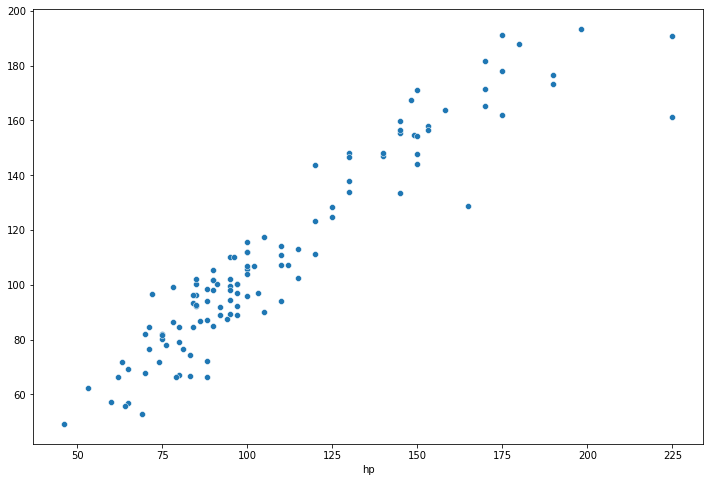

In [38]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test1,pred)
# Almost a linear line with with very little errors small errors

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='hp'>

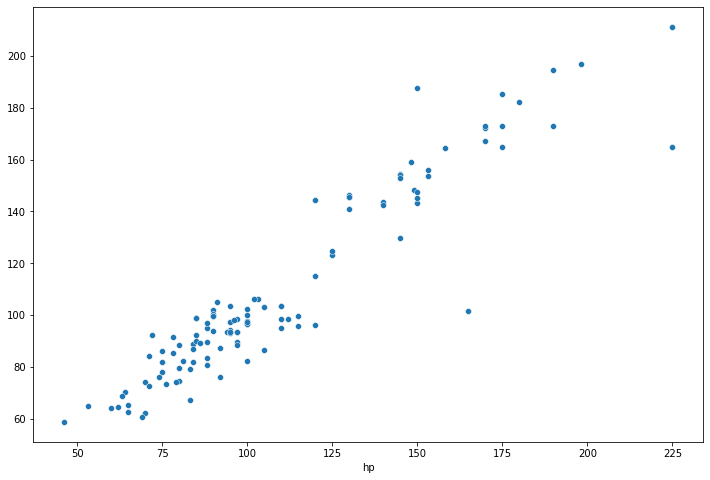

In [39]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test,pred11)
#KNN Regressor also does the same but Linear model is better compared to KNN

In [40]:
print('The training score is {} and test score is {}'.format(LR.score(X_train1,y_train1),LR.score(X_test1,y_test1)))
#Not very bad but looks slightly overfitted

The training score is 0.8993213561049815 and test score is 0.8852150238699498


In [41]:
print('The training score is {} and test score is {}'.format(knr.score(X_train,y_train),knr.score(X_test,y_test)))
#KNN regressor looks bad and hence we dont take it

The training score is 0.9442934949092631 and test score is 0.8850118439312136


In [42]:
with open('LR.pkl', 'rb') as file:
    model1 = pickle.load(file)

df['hp1'] = model1.predict(df[['disp','wt','cyl','mpg','origin','acc']])

def fill_na_value_hp(x,y):
    if pd.isna(x):
        return y
    else:
        return x

df['hp'] = df.apply(lambda x: fill_na_value_hp(x['hp'],x['hp1']),axis=1)
df.drop(['hp1'],axis=1,inplace=True)    

In [43]:
df.isnull().sum()
#Missing values found and filled

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

# Drop attribute/s if required using relevant functional knowledge

In [44]:
df['car_name'] = df['car_name'].apply(lambda x: x.split()[0])
#In this dataset we dont find a proper trend with the vehicles name or vehicles brand name. Tried grouping  the data
#using carname and viewed the mpg and other metrics as a mean, couldnt find a trend hence dropping.

In [45]:
df.drop('car_name',axis=1,inplace=True)

# Perform another kind of corrections/treatment on the data

### 1. One hot encode the "yr" columns - this dataframe will be "dff"

In [46]:
df['yr'].unique()
# These are the years, they are not ordinal type and hence we are not applying label encoding technique, we will apply
# one hot encoding.

array([70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82], dtype=int64)

In [47]:
dff = pd.concat([df,pd.get_dummies(df['yr'],drop_first=True)],axis=1)
dff.drop('yr',axis=1,inplace=True)

### 2. Label Encode "yr" - this dataframe will be "df"

In [48]:
df.groupby('yr')['mpg'].mean()

#There is a trend where MPG value is low for years 70,71,72,73 where there were no efficient engines the average mpg
#is 17.25, later in 74,75,76,77,78,79 the average mpg has increased 21.3 and later in 80,81,82 the average mpg is 31.6
#We will label encode 70-73 as "1" considering it had the worst engines, 74-79 as "2" as it had comparitively
#better engines, 80-82 as "3" as it is the best as per the data

yr
70    17.689655
71    21.250000
72    18.714286
73    17.100000
74    22.703704
75    20.266667
76    21.573529
77    23.375000
78    24.061111
79    25.093103
80    33.696552
81    30.334483
82    31.709677
Name: mpg, dtype: float64

In [49]:
def label(x):
    if x<=73:
        return 1
    elif x>73 and x<= 79:
        return 2
    else:
        return 3
        
df['yr'] = df['yr'].apply(label)

In [50]:
df.groupby('yr')['mpg'].mean()

yr
1    18.528000
2    22.841848
3    31.908989
Name: mpg, dtype: float64

# Data analysis & visualisation:

## Perform detailed statistical analysis on the data.

In [82]:
Nullhyp ='Origin plays role for categorical years'
Althyp = 'Origin does not play a role for years'
zero = df[df['yr'] == 1]['mpg']
one = df[df['yr'] == 2]['mpg']
two = df[df['yr'] == 3]['mpg']
f_stat, p_value = stats.f_oneway(zero,one,two)
print(p_value)
# We fail to reject null hypothesis as p value is very much less than 0.5 which means year does play a role in mpg increase
# or decrease

3.7718745977946315e-43


# We can confirm that years does play a role in MPG increase or decrease

In [77]:
Nullhyp ='Origin plays role for categorical years'
Althyp = 'Origin does not play a role for years'
zero = df[df['origin'] == 1]['mpg']
one = df[df['origin'] == 2]['mpg']
two = df[df['origin'] == 3]['mpg']
f_stat, p_value = stats.f_oneway(zero,one,two)
print(p_value)

# We fail to reject null hypothesis as p value is very much less than 0.5 which means origin plays a role in mpg

1.9154864184128e-35


# We can confirm that origin does play a role in MPG increase or decrease

In [84]:
df['cyl'].unique()

array([8, 4, 6, 3, 5], dtype=int64)

In [85]:
Nullhyp ='Origin plays role for categorical years'
Althyp = 'Origin does not play a role for years'
eight = df[df['cyl'] == 8]['mpg']
four = df[df['cyl'] == 4]['mpg']
six = df[df['cyl'] == 6]['mpg']
three = df[df['cyl'] == 3]['mpg']
five = df[df['cyl'] == 5]['mpg']
f_stat, p_value = stats.f_oneway(eight,four,six,three,five)
print(p_value)

# We again fail to reject null hypothesis as p value is very much less than 0.5 which means cylinders too play role in
# increase or decrease of mpg

3.679939295400561e-85


# We can also confirm that cylinder does play a role in MPG increase or decrease

# Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.

### Origin : With the increase in origin the mpg also increases, for eg: If a country A produces good vehicles that has high mpg then that country will have the highest value.

### Accelaration : The higher the accelaration the better the mpg, as per the data!!. Considering the accelaration value being only till 24, i think accelaration at 24 miles per hour is good as you cannot drive too slow and expect to have a higher mileage. You always need to drive at a standarad speed  and maintain the speed to achieve the mileage.

### Cylinder : The higher the number of cylinders the higher the power output of engine, the higher the power output of engine the lower the mpg

### Displacement : The higher the engine displacement , the higher the engine power and the more the power lesser the mpg

### Horse Power: The horse power explains the amount of power that engine can produce, the higher the horse power the higher is the engine power and the lower is the mpg.

### Weight : The weight is the major factor that affects the mpg, the higher the weight the lower the mpg.

# Origin

In [51]:
df.groupby('origin')['mpg'].mean()
# We see that the origin with 1 has the least mpg and origin with 3 has the highest mpg so 1 must be a country that produces
# cars but not with efficient engine to have higher mileage but country with origin 3 must be producing better cars
# with better mileage. eg: Origin 3 could be germany as they produce the best and efficient cars

origin
1    20.083534
2    27.891429
3    30.450633
Name: mpg, dtype: float64

<AxesSubplot:xlabel='origin', ylabel='mpg'>

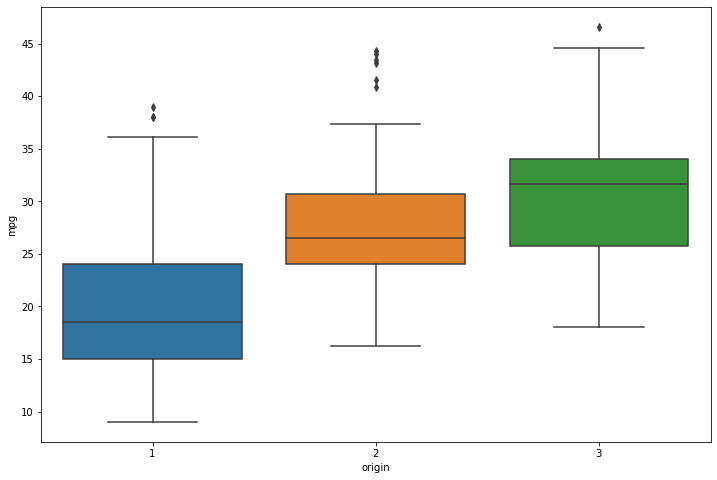

In [52]:
plt.figure(figsize=(12,8))
sns.boxplot(x='origin',y='mpg',data=dff)
#higher origin value displays a better mpg

# Accelaration

<AxesSubplot:xlabel='acc', ylabel='mpg'>

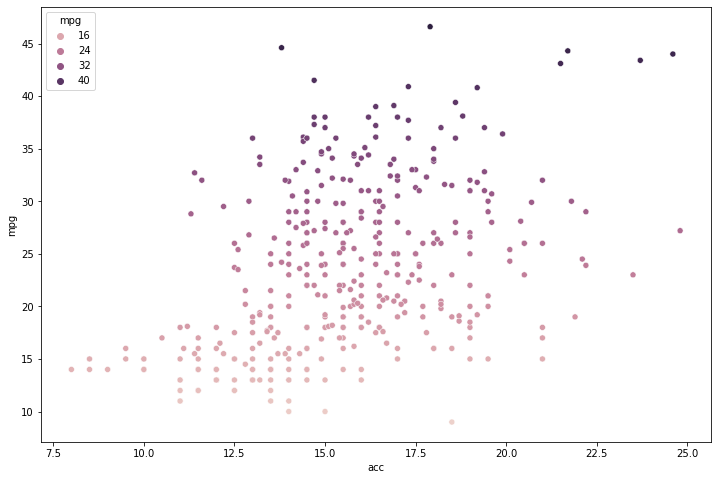

In [53]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='acc',y='mpg',data=dff,hue='mpg')
# We see an increase in mpg with increase in accelaration, explained above

# Cylinders

In [54]:
df.groupby('cyl')['mpg'].mean()
#Lower the cylinder higher pressure on engine to pull weight, this constitues to cylinder 3 having low mpg
#4 and 5 cylinders contain high mpg
# 6 and 8 cylinders are for high performance engines, either a truck or a supercar with less mileage eg: Bugatti veyron
# has W16 engine with sixteen cylinder piston engine but has the least mileage

cyl
3    20.550000
4    29.286765
5    27.366667
6    19.985714
8    14.963107
Name: mpg, dtype: float64

<AxesSubplot:xlabel='cyl', ylabel='mpg'>

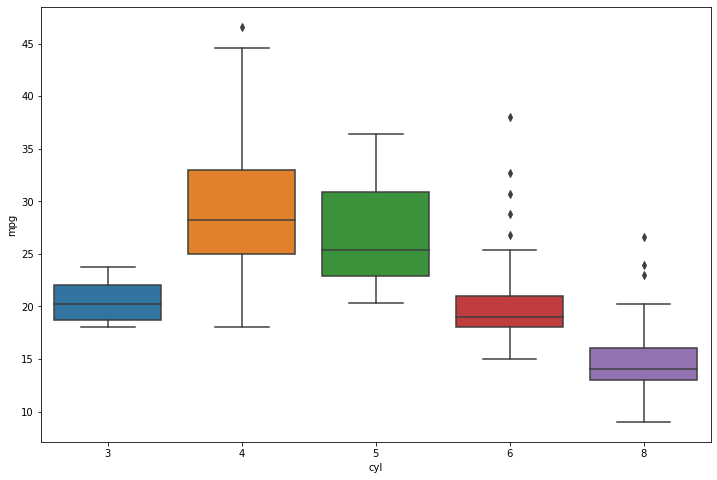

In [55]:
plt.figure(figsize=(12,8))
sns.boxplot(x='cyl',y='mpg',data=dff)
#If a car has the least number of cylinders like 3, its definetly a pain for engine to pull load but a car with 
#4 or 5 engines give better mpg and the more the cylinders the lesser the mpg

# HP

## Bugatti veyron has 1001 hp but with least mileage

<AxesSubplot:xlabel='hp', ylabel='mpg'>

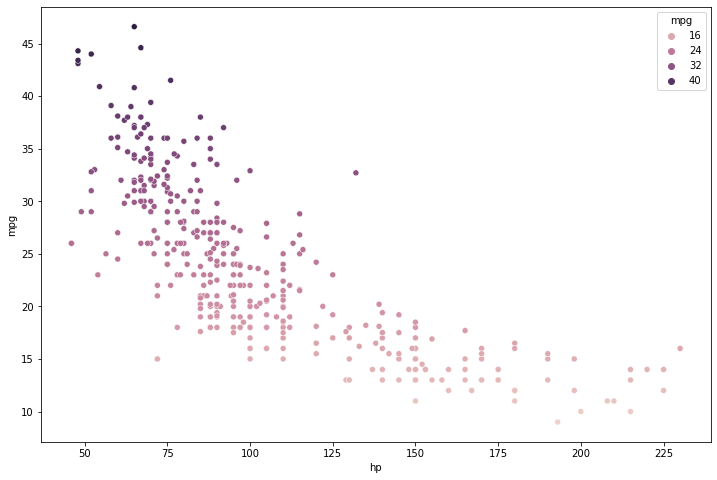

In [56]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='hp',y='mpg',data=dff,hue='mpg')
# A very clear inference can be made on the below plot, the increase in "HP" (a super car) reduces the "MPG"

# Displacement 

<AxesSubplot:xlabel='disp', ylabel='mpg'>

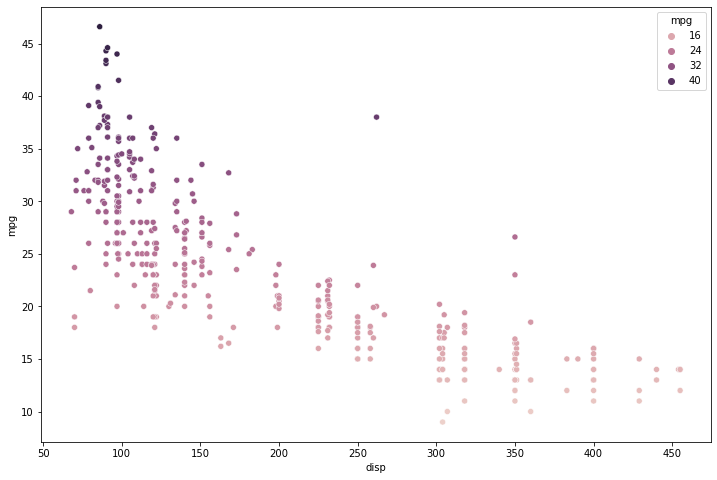

In [57]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='disp',y='mpg',data=dff,hue='mpg')
#This is kind of a discrete data but seems to be continuous as there are more unique values, this also clearly
#explains that the increase in displacement of engine volume allows for more power output and ultimately reduces mpg

# Weight

<AxesSubplot:xlabel='wt', ylabel='mpg'>

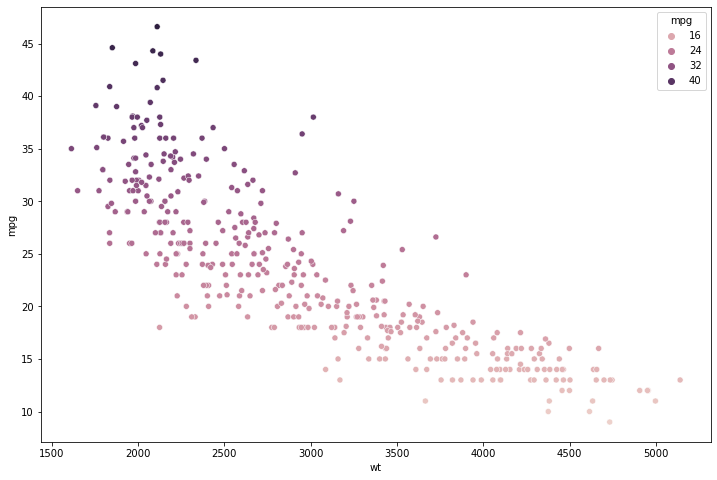

In [58]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='wt',y='mpg',data=dff,hue='mpg')
#This attribute clearly shows with increase in weight there is reduction in mpg, it is known that weight is inversely
#proportional to mpg

# year

<AxesSubplot:xlabel='yr', ylabel='mpg'>

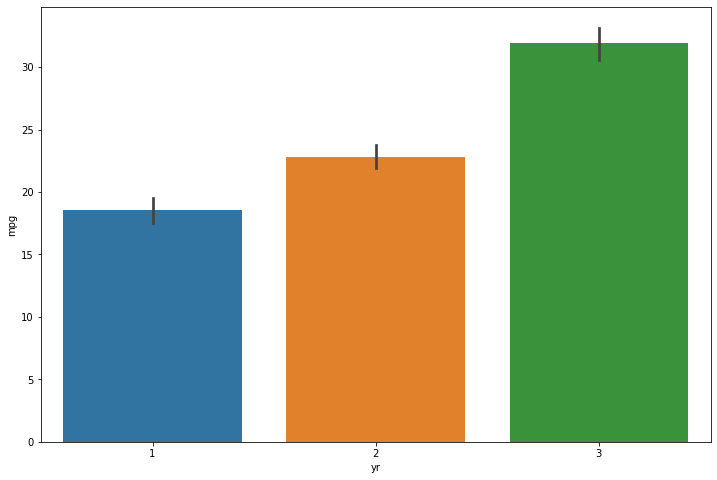

In [59]:
plt.figure(figsize=(12,8))
sns.barplot(x='yr',y='mpg',data=df)
#YR 1 contains year 70,71,72,73 with lowest mpg, 74,75,76,77,78,79 has comparitively better mpg and 
#80, 81, 82 has highest mpg

In [60]:
dff.corr()['mpg'].sort_values(ascending=False)
# dff is yr that is one hot encoded

mpg       1.000000
origin    0.563450
acc       0.420289
80        0.365663
82        0.305116
81        0.244922
79        0.056689
78        0.022079
77       -0.004919
74       -0.028023
76       -0.075995
71       -0.079804
75       -0.118796
72       -0.169164
73       -0.274675
cyl      -0.775396
hp       -0.777403
disp     -0.804203
wt       -0.831741
Name: mpg, dtype: float64

In [61]:
df.corr()['mpg'].sort_values(ascending=False)
#df is where yr is lable encoded to 1,2,3

mpg       1.000000
yr        0.606176
origin    0.563450
acc       0.420289
cyl      -0.775396
hp       -0.777403
disp     -0.804203
wt       -0.831741
Name: mpg, dtype: float64

In [262]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
# For offline use
cf.go_offline()
# For Notebooks
init_notebook_mode(connected=True)

In [263]:
df[['yr','origin','mpg']].iplot(kind='surface',colorscale='rdylbu')
#viewing few fields in 3d

In [264]:
df[['acc','cyl','mpg']].iplot(kind='surface',colorscale='rdylbu')

In [265]:
df[['hp','disp','mpg']].iplot(kind='surface',colorscale='rdylbu')

# Machine learning:

### Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.

#### We will use pair plot to find approx number of cluster 

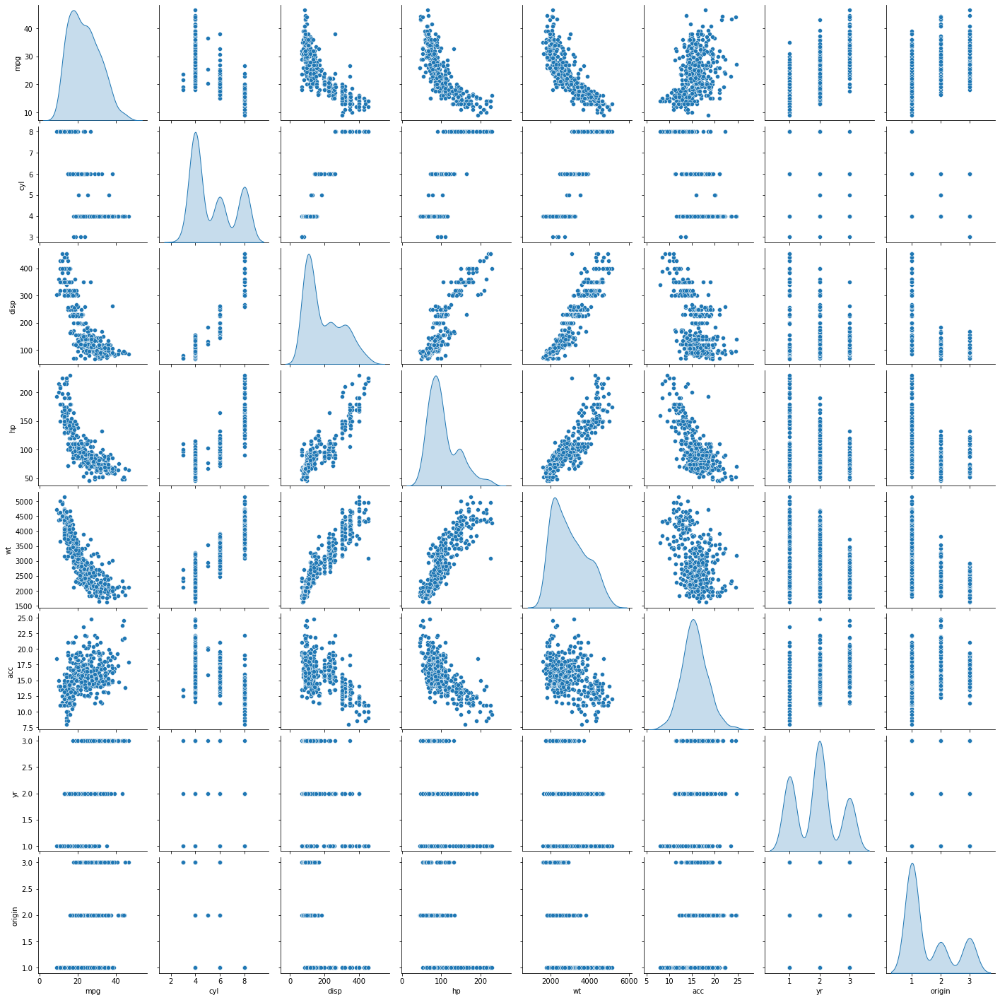

In [194]:
sns.pairplot(df,diag_kind = 'kde')
#We can guess that there are 3 groups using pairplot in df dataframe

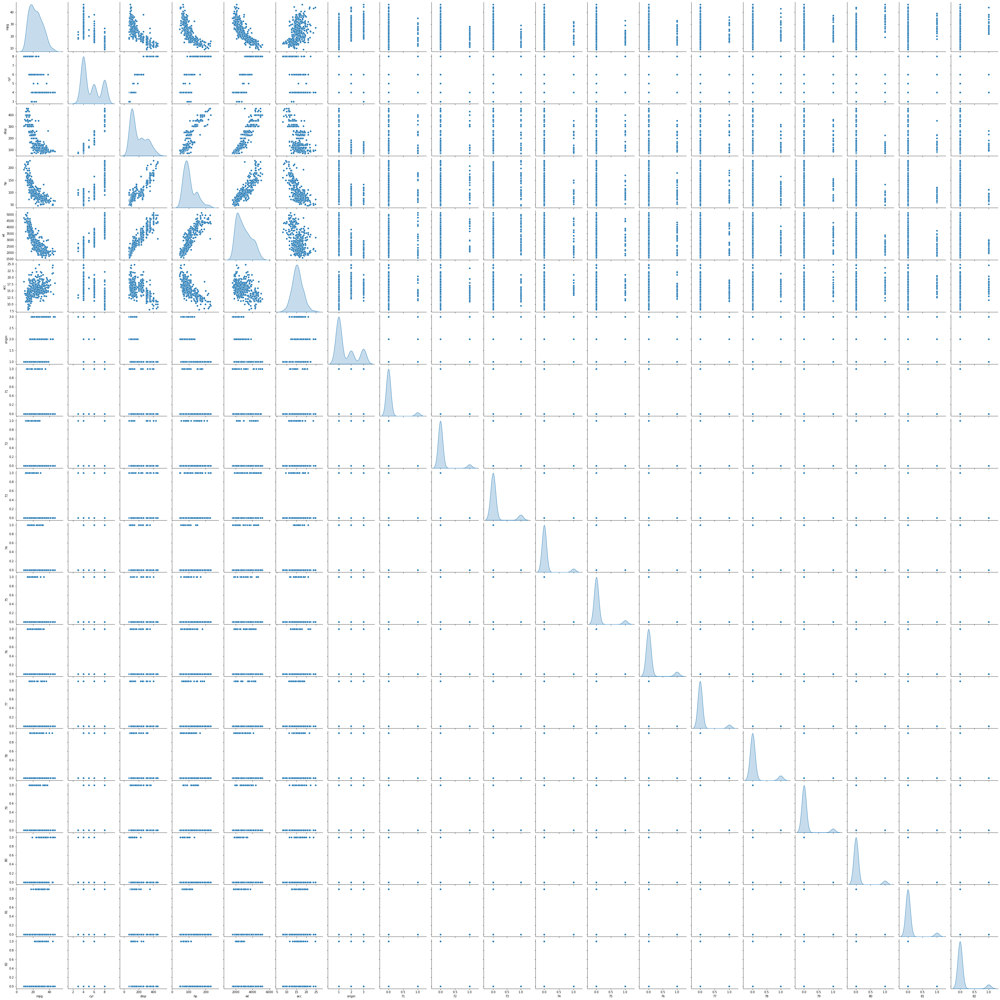

In [195]:
sns.pairplot(dff,diag_kind = 'kde')
# Even the dff with one hot encoding shows possibility of 3 groups

# Scaling the data before clustering

In [66]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore
# We can use zscore or standarad scaler but here we use standarad scaler on df(label encoded yr) and dff(one hot encoded yr)


SS = StandardScaler()
SS1 = StandardScaler()
df_1 = SS.fit_transform(df)
dff_1 = SS1.fit_transform(dff)

# Using Kmeans on df dataframe which has label encoded "yr"
## Gives a good elbow

C:\Users\kragha\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Text(0.5, 1.0, 'Selecting k with the Elbow Method')

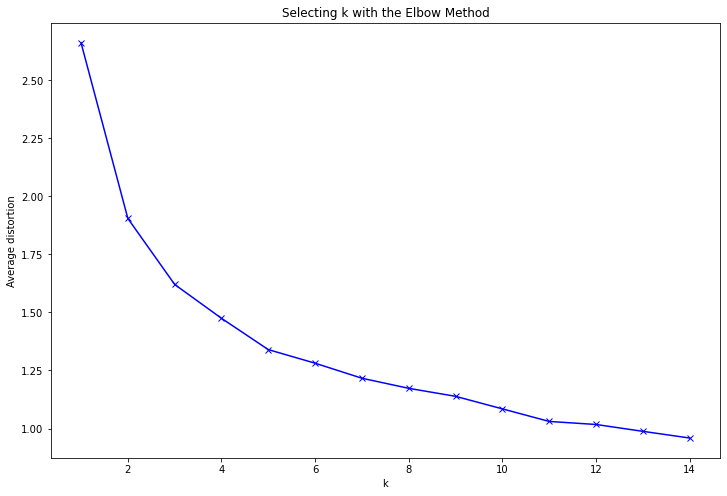

In [67]:
from scipy.spatial.distance import cdist
clusters=range(1,15)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(df_1)
    prediction=model.predict(df_1)
    meanDistortions.append(sum(np.min(cdist(df_1, model.cluster_centers_, 'euclidean'), axis=1)) / df_1.shape[0])

plt.figure(figsize=(12,8))
plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


# Using Kmeans on dff dataframe that has year one hot encoded

C:\Users\kragha\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



Text(0.5, 1.0, 'Selecting k with the Elbow Method')

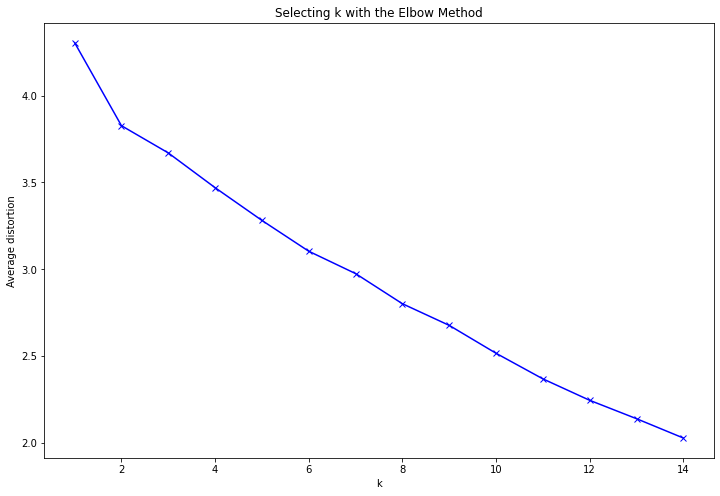

In [68]:
from scipy.spatial.distance import cdist
clusters=range(1,15)
meanDistortions=[]

for k in clusters:
    model1=KMeans(n_clusters=k)
    model1.fit(dff_1)
    prediction=model1.predict(dff_1)
    meanDistortions.append(sum(np.min(cdist(dff_1, model1.cluster_centers_, 'euclidean'), axis=1)) / dff_1.shape[0])


plt.figure(figsize=(12,8))
plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


In [69]:
from sklearn.metrics import silhouette_score

In [70]:
krange = np.arange(2,15)
for n in krange:
    model = KMeans(n_clusters=n,max_iter=400)
    model.fit(df_1)
    pred = model.predict(df_1)
    
    print(f"For {n} the silhouette score is : ")
    print(silhouette_score(df_1,pred))
    print(f'The WCSS for {n} is {model.inertia_}\n')


For 2 the silhouette score is : 
0.4163810722889244
The WCSS for 2 is 1581.807116395797

For 3 the silhouette score is : 
0.32726340739818194
The WCSS for 3 is 1176.210773422119

For 4 the silhouette score is : 
0.3090850636603717
The WCSS for 4 is 980.3839114418297

For 5 the silhouette score is : 
0.33410195789697844
The WCSS for 5 is 821.7687993749705

For 6 the silhouette score is : 
0.3406837426403039
The WCSS for 6 is 742.8925267187502

For 7 the silhouette score is : 
0.30186954821152656
The WCSS for 7 is 675.3591444524089

For 8 the silhouette score is : 
0.2964198909395478
The WCSS for 8 is 632.7401914887758

For 9 the silhouette score is : 
0.29086573140804833
The WCSS for 9 is 595.6919303698706

For 10 the silhouette score is : 
0.2960164714358299
The WCSS for 10 is 549.1489989985386

For 11 the silhouette score is : 
0.2952902406314679
The WCSS for 11 is 520.4636682812604

For 12 the silhouette score is : 
0.29086775520044517
The WCSS for 12 is 486.6762881427347

For 13 the

In [71]:
krange1 = np.arange(2,14)
for n in krange1:
    model1 = KMeans(n_clusters=n,max_iter=400)
    model1.fit(dff_1)
    pred = model1.predict(dff_1)
    print(f"For {n} the silhouette score is : ")
    print(silhouette_score(dff_1,pred))
    print(f'The WCSS for {n} is {model1.inertia_}\n')
    
#Since the one hot encoded version has a very high WCSS and bad silhoutte score, we drop this here and proceed only
# with df_1

For 2 the silhouette score is : 
0.1941930637089356
The WCSS for 2 is 5944.795367515189

For 3 the silhouette score is : 
0.12286590551032947
The WCSS for 3 is 5513.31822790936

For 4 the silhouette score is : 
0.20256598208421012
The WCSS for 4 is 5099.574234171916

For 5 the silhouette score is : 
0.2334507265375493
The WCSS for 5 is 4655.79217564751

For 6 the silhouette score is : 
0.2497309085586641
The WCSS for 6 is 4380.619990426103

For 7 the silhouette score is : 
0.29636525350310183
The WCSS for 7 is 3938.316326803604

For 8 the silhouette score is : 
0.3306339496151809
The WCSS for 8 is 3567.022948576037

For 9 the silhouette score is : 
0.36328609968045306
The WCSS for 9 is 3215.6222795048275

For 10 the silhouette score is : 
0.3924620584937119
The WCSS for 10 is 2852.4314956184703

For 11 the silhouette score is : 
0.41371189827075644
The WCSS for 11 is 2551.615469223483

For 12 the silhouette score is : 
0.43230730789304056
The WCSS for 12 is 2313.6781258091273

For 13 t

In [72]:
model = KMeans(n_clusters=3,max_iter=400)
model.fit(df_1)
df['class_kmeans'] = model.predict(df_1)

In [73]:
df.groupby('class_kmeans')[['mpg','cyl','disp','hp','wt','acc','yr']].mean()

# The cluster 3 seperates all the features better than the other ones - there could be  efficient engine cars that came 
# recently which has a good mileage (class0) and then comes older cars which does not have much efficient engines & low
# mileage so they could be class 2 and then class 1 is in between class 2(low performance engines) and 0 high performance
# engines, it has higher efficiency engine that focuses on performance and also mileage. My opinion regarding clusters is \
# 3 as the mean average of all columns show a distinct value. (have tested on k = 4,6,10,12 but 3 remained the best)

,mpg,cyl,disp,hp,wt,acc,yr
class_kmeans,,,,,,,
0,21.819444,5.194444,184.857639,94.494101,2979.243056,16.752083,1.930556
1,14.715000,7.980000,346.370000,160.550000,4126.910000,12.721000,1.420000
2,30.813636,4.058442,102.123377,76.321999,2211.214286,16.309740,2.207792


# Hirerachichal clustering

In [74]:
from sklearn.cluster import AgglomerativeClustering

In [75]:
ac = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')
ac.fit(df_1)
#we will go with the same 3 clusters

AgglomerativeClustering(linkage='average', n_clusters=3)

In [76]:
df['Class_agglomerative'] = ac.labels_

In [77]:
df

,mpg,cyl,disp,hp,wt,acc,yr,origin,class_kmeans,Class_agglomerative
0,18.0,8,307.0,130.0,3504,12.0,1,1,1,1
1,15.0,8,350.0,165.0,3693,11.5,1,1,1,1
2,18.0,8,318.0,150.0,3436,11.0,1,1,1,1
3,16.0,8,304.0,150.0,3433,12.0,1,1,1,1
4,17.0,8,302.0,140.0,3449,10.5,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...
393,27.0,4,140.0,86.0,2790,15.6,3,1,0,0
394,44.0,4,97.0,52.0,2130,24.6,3,2,2,0
395,32.0,4,135.0,84.0,2295,11.6,3,1,2,0
396,28.0,4,120.0,79.0,2625,18.6,3,1,0,0


In [78]:
df.groupby('class_kmeans').mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin,Class_agglomerative
class_kmeans,,,,,,,,,
0,21.819444,5.194444,184.857639,94.494101,2979.243056,16.752083,1.930556,1.131944,1.006944
1,14.715000,7.980000,346.370000,160.550000,4126.910000,12.721000,1.420000,1.000000,1.010000
2,30.813636,4.058442,102.123377,76.321999,2211.214286,16.309740,2.207792,2.357143,0.000000


In [79]:
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  #Pairwise distribution between data points

Z1 = linkage(df_1, metric='euclidean', method='average')
c, coph_dists = cophenet(Z1 , pdist(df_1))
c
#Label encoded version has 70.3% cophenetic correlation

0.7035080639167409

In [80]:
Z2 = linkage(dff_1, metric='euclidean', method='average')
c, coph_dists = cophenet(Z2 , pdist(dff_1))
c
#one hot encoded version has 72.4% cophenetic correlation, this is also a reason for not picking dff_1

0.7247710756507207

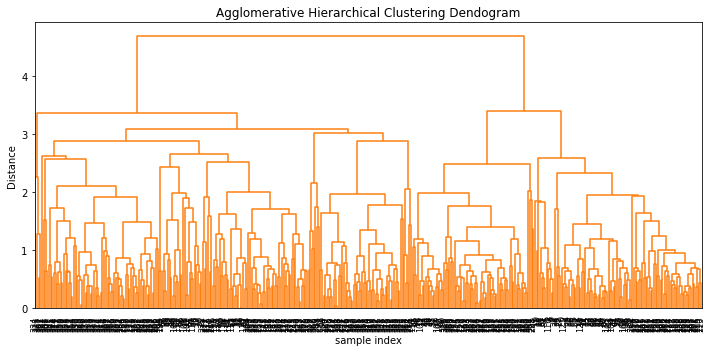

In [334]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z1, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

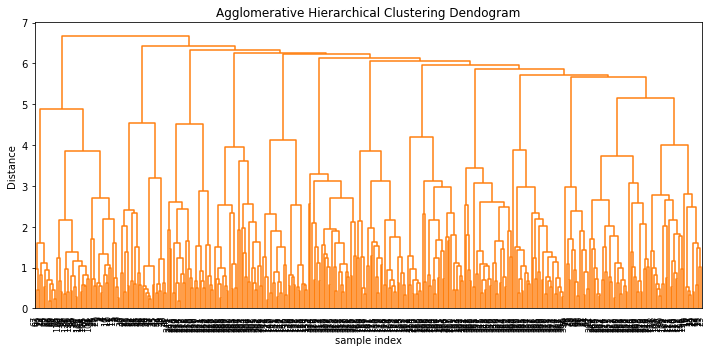

In [335]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z2, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

# Share your insights about the difference in using these two methods

#### 1. Both these methods have a slight difference, k means clustering takes centroid and uses this to form cluster by comparing it with all points and also it requires k value in advance. 

#### 2. In hirechichal clustering we end up forming clusters based on hierarchy by comparing each point with every other and form clusters based on nearby points and go till the end of clustering all the points. Finally we get to have the independence of selecting any number of clusters.

#### 3. In general hirechical clustering is time consuming and hence its not mostly preferred but k means is quicker so we pick K means clustering. 

#### 4. Also  Hirechical clustering is more informative than k means and this leads to identify the number of clusters with ease whereas its not the same in kmeans.

#### 5. Note: Kmeans clustering takes random centroid so it  always requires multiple runs to make sure that all the points are clustered at right location without having incorrect clusters

# Answer below questions based on outcomes of using ML based methods.

## Mention how many optimal clusters are present in the data and what could be the possible reason behind it. 

#### 1. As per the data, i personally feel there are 3 clusters as we get to see a distinct number on all features for k = 3 

#### 2. The k = 3 clusters is because the years field contains 70 - 82 which shows almost a decade of time while car is manufactured, it always takes a decade to really come up with an efficient engine, also the data was speaking the same. The cars manufactured from 70 - 73 had an average mpg of 18, cars manufacured post 79 had mpg of 31 and the middle years of 74 - 79 had a mediocre mileage of 22

#### 3. So, it could be that from 70 - 73 the manufacturing sector must have worked on engines but they might not have been efficient, from 74 - 79 engines might have got slightly better with improvement in technology and post 79 is almost a decade since 70 so there definetly is a great improvement in quality of engines leading to better mpg

#### 4. We prefer taking the label encoded years dataset ie: df but we will still explain on both df and dff

# Use linear regression model on different clusters separately and print the coefficients of the models individually

In [81]:
a = df.drop('Class_agglomerative',axis=1) 
# Contains label encoded years

## Focusing on df dataframe that has yr label encoded

In [82]:
X_0 = a[a['class_kmeans']==0].drop(['class_kmeans','mpg','acc'],axis=1)
y_0 = a[a['class_kmeans']==0]['mpg']


X_1 = a[a['class_kmeans']==1].drop(['class_kmeans','mpg','acc'],axis=1)
y_1 = a[a['class_kmeans']==1]['mpg']


X_2 = a[a['class_kmeans']==2].drop(['class_kmeans','mpg','acc'],axis=1)
y_2 = a[a['class_kmeans']==2]['mpg']


X = a.drop(['class_kmeans','mpg','acc'],axis=1)
y = a['mpg']


X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X_0, y_0, test_size=0.3, random_state=101)

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.3, random_state=101)

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3, random_state=101)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)


lm0_Le = LinearRegression()
lm1_Le = LinearRegression()
lm2_Le = LinearRegression()
lm_Le_complete = LinearRegression()
# Instantiate the objects

lm0_Le.fit(X_train_0,y_train_0)
lm1_Le.fit(X_train_1,y_train_1)
lm2_Le.fit(X_train_2,y_train_2)
lm_Le_complete.fit(X_train,y_train)
# Fit with training data

LinearRegression()

In [84]:
print("Training Score {}".format(lm0_Le.score(X_train_0,y_train_0)))
print("Testing Score {}".format(lm0_Le.score(X_test_0,y_test_0)))

Training Score 0.6057035952260261
Testing Score 0.4922678580751104


In [85]:
print("Training Score {}".format(lm1_Le.score(X_train_1,y_train_1)))
print("Testing Score {}".format(lm1_Le.score(X_test_1,y_test_1)))

Training Score 0.5502537637837048
Testing Score 0.5100557554240124


In [86]:
print("Training Score {}".format(lm2_Le.score(X_train_2,y_train_2)))
print("Testing Score {}".format(lm2_Le.score(X_test_2,y_test_2)))

Training Score 0.6545817558754554
Testing Score 0.580456524327507


In [87]:
print("Training Score {}".format(lm_Le_complete.score(X_train,y_train)))
print("Testing Score {}".format(lm_Le_complete.score(X_test,y_test)))
#This looks the best in terms of model score in train and test

Training Score 0.8085818816515584
Testing Score 0.8448881425061473


In [88]:
lm0_Le.coef_
#Linear regression coefficients for class 0 with dataframe

array([-0.48315133,  0.01437599, -0.06523904, -0.00572686,  3.01868259,
        1.06436671])

In [89]:
lm1_Le.coef_
#Linear regression coefficients for class 1 with dataframe

array([-1.02302324,  0.02128272, -0.02646155, -0.00329697,  2.08385254,
        0.        ])

In [90]:
lm2_Le.coef_
#Linear regression coefficients for class 2 with dataframe

array([-7.84541039e-02, -4.51946307e-04, -1.23959478e-01, -5.00311676e-03,
        4.21838911e+00, -2.65079768e-01])

In [91]:
lm_Le_complete.coef_
#Linear regression coefficients for complete dataframe looks alot Smaller compared to the others

array([ 0.06449934,  0.00616513, -0.01620336, -0.006136  ,  4.01301215,
        1.36094041])

In [92]:
from sklearn.linear_model import Lasso
#Trying out Lasso Regression as it is stricter than ridge to reduce or drop unwanted coefficients
lasso = Lasso(alpha=0.1)
lasso_0 = Lasso(alpha=0.1)
lasso_1 = Lasso(alpha=0.1)
lasso_2 = Lasso(alpha=0.1)

lasso.fit(X_train,y_train)
print ("Lasso model:", (lasso.coef_))
y_pred_L = lasso.predict(X_test)

lasso_0.fit(X_train_0,y_train_0)
print ("Lasso model 0:", (lasso_0.coef_))
y_pred_L_0 = lasso_0.predict(X_test_0)

lasso_1.fit(X_train_1,y_train_1)
print ("Lasso model 1:", (lasso_1.coef_))
y_pred_L_1 = lasso_1.predict(X_test_1)

lasso_2.fit(X_train_2,y_train_2)
print ("Lasso model 2:", (lasso_2.coef_))
y_pred_L_2 = lasso_2.predict(X_test_2)

Lasso model: [ 0.          0.00466179 -0.0155758  -0.00608974  3.76453135  1.09506538]
Lasso model 0: [-2.47924675e-02 -5.76667483e-04 -6.04132012e-02 -5.16890940e-03
  2.68102128e+00  0.00000000e+00]
Lasso model 1: [-0.          0.01735072 -0.02558574 -0.00329942  1.65306846  0.        ]
Lasso model 2: [-0.00000000e+00  1.21847874e-03 -1.31098879e-01 -4.81249258e-03
  4.01583869e+00 -5.74210673e-02]


In [93]:
print("Training Score {}".format(lasso_0.score(X_train_0,y_train_0)))
print("Testing Score {}".format(lasso_0.score(X_test_0,y_test_0)))

Training Score 0.5977573714217661
Testing Score 0.5177555919705407


In [94]:
print("Training Score {}".format(lasso_1.score(X_train_1,y_train_1)))
print("Testing Score {}".format(lasso_1.score(X_test_1,y_test_1)))

Training Score 0.5334411440895575
Testing Score 0.5125134976013992


In [95]:
print("Training Score {}".format(lasso_2.score(X_train_2,y_train_2)))
print("Testing Score {}".format(lasso_2.score(X_test_2,y_test_2)))

Training Score 0.653403803065579
Testing Score 0.5742058890474901


In [96]:
print("Training Score {}".format(lasso.score(X_train,y_train)))
print("Testing Score {}".format(lasso.score(X_test,y_test)))

Training Score 0.8077293137963324
Testing Score 0.8469825978601436


In [99]:
from sklearn.metrics import r2_score
y_pred_0 = lm0_Le.predict(X_test_0)
y_pred_1 = lm1_Le.predict(X_test_1)
y_pred_2 = lm2_Le.predict(X_test_2)
y_pred = lm_Le_complete.predict(X_test)

In [101]:
r2_score(y_test,y_pred)
# Rsquare score for Complete dataset

0.8448881425061473

In [102]:
r2_score(y_test_0,y_pred_0)
# Rsquare score for clustered dataset

0.4922678580751104

In [103]:
r2_score(y_test_1,y_pred_1)
# Rsquare score for clustered dataset

0.5100557554240124

In [104]:
r2_score(y_test_2,y_pred_2)
# Rsquare score for clustered dataset

0.580456524327507

In [110]:
print(1-(1-r2_score(y_test, y_pred))*((len(X_test)-1)/(len(X_test)-len(X_test.iloc[0])-1)))
#The adjusted RSquared metric looks the best on the complete dataset than the ones on clustered
#We will only look into adjusted RSquared metric as   we are using multiple features

0.8374427733464423


In [111]:
print(1-(1-r2_score(y_test_0, y_pred_0))*((len(X_test_0)-1)/(len(X_test_0)-len(X_test_0.iloc[0])-1)))
#The adjusted RSquared metric is not good compared to a total model

0.40993291614134464


In [112]:
print(1-(1-r2_score(y_test_1, y_pred_1))*((len(X_test_1)-1)/(len(X_test_1)-len(X_test_1.iloc[0])-1)))
#The adjusted RSquared metric is not good compared to a total model

0.38224421336071124


In [113]:
print(1-(1-r2_score(y_test_2, y_pred_2))*((len(X_test_2)-1)/(len(X_test_2)-len(X_test_2.iloc[0])-1)))
#The adjusted RSquared metric is not good compared to a total model

0.5175250029766332


# How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

# Linear Regression Impact

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

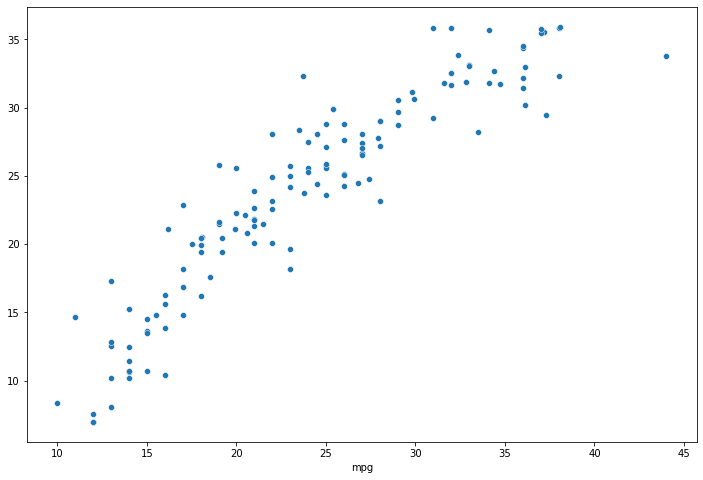

In [114]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test,y_pred)
#Linear regression on complete dataset

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

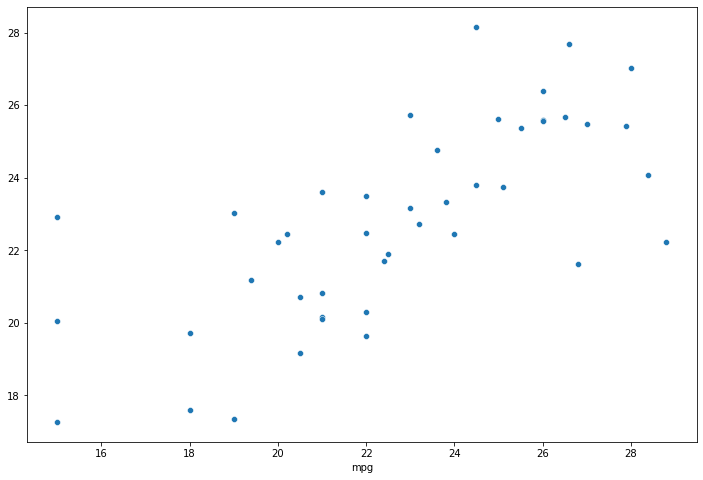

In [115]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_0,y_pred_0)
# The predicted and the actual values Looks like a cloud

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

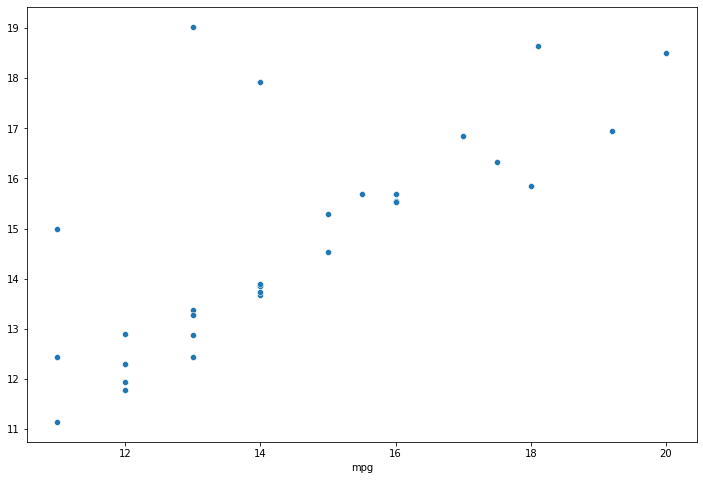

In [116]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_1,y_pred_1)
# The predicted and the actual values Looks almost like a linear line

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

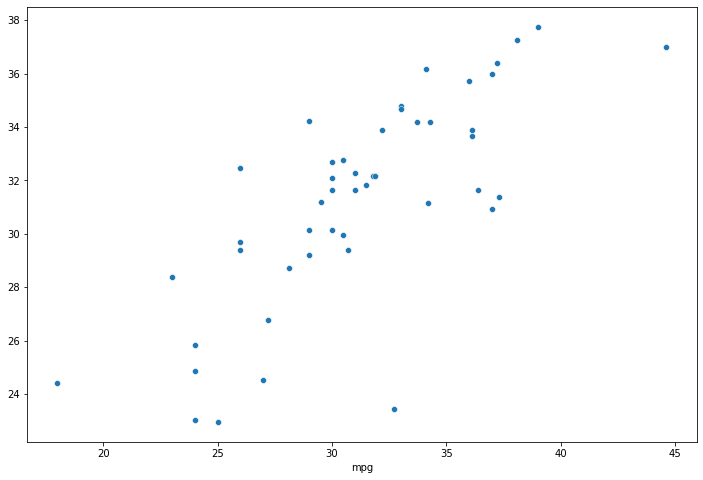

In [117]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_2,y_pred_2)
# The predicted and the actual values Looks almost like a linear line

# Lasso Regression - Both Linear regression and Lass regression look the same

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

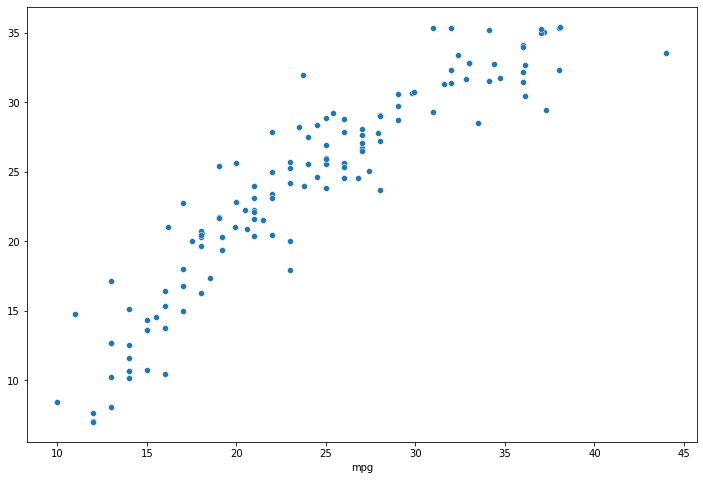

In [118]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test,y_pred_L)
#Linear regression on complete dataset

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

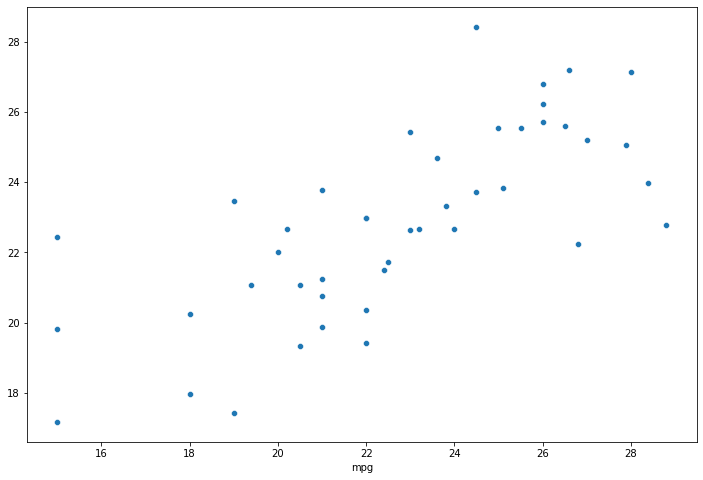

In [119]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_0,y_pred_L_0)
#Linear regression on class0

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

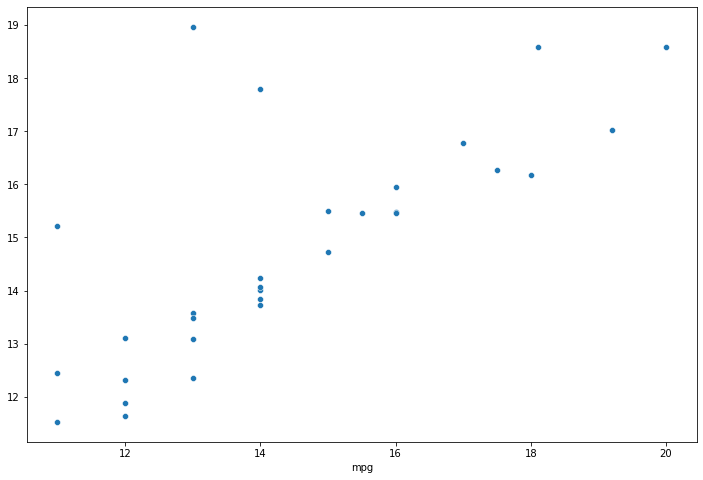

In [120]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_1,y_pred_L_1)
#Linear regression on class1

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='mpg'>

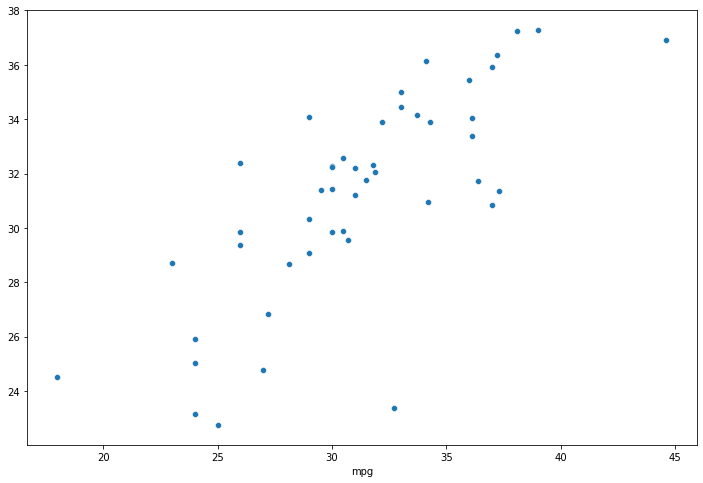

In [121]:
plt.figure(figsize=(12,8))
# plt.scatter(y_test,pred,h)
sns.scatterplot(y_test_2,y_pred_L_2)
#Linear regression on class2

# In this case using Linear model on a complete Dataset will be the best as the Predicted vs Actual looks better on complete dataset. This could also be because of low number of records.

# The total dataset contains 398 rows but when clustered the data gets split into approx 133 each on all 3 clusters which is a very less number of records to train and make a prediction.

# The Clustered version contains a very bad predicted vs Actual, some of them look like clouds but we could see a bit of linearity in the data.

# Also the adjusted R Squared score for:

### Complete dataset is 83.7%
### For  Cluster 0 : 40.99%, Cluster 1 : 38.22% and for cluster 2 : 58.75%


## On the whole if the Dataset contains more number of records and if the data is clustered then it will lead to splitting Gaussians of different clusters. This will inturn reduce the skewness and also the outliers which is the main issue of Linear regression but in this case the number of records is too less that when it is splitted the clusters guassian are split but there is not enough record to train and make a good prediction.

## Linear Regression's main issue is the outliers as it assumes that the data is linear but when the outliers come in place then it deflects the prediction and makes it worse.

## In that case if we could cluster the data say 3 ideal clusters then it means that there were 3 guassian distributions that were merged and merging of different guassians causes skewness and outliers. Once we split them using clusters the chances of skewness and outliers will be drastically reduced and post this linear model can be applied on all 3 clusters to get a good prediction. (Provided clustered version contains enough track records to train with)


# Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future.


#### 1. In this case we have a very less number of data to split into clusters and apply linear regression. Theoritically we know that if a data is a mix up of multiple guassians then its better to cluster them and apply linear regression.Also If the data is of high quantity, we have more data but if the quality of the data is bad or data is unrealistic data then your model will not be trained well to make the right predictions. On the other hand if the Quality of the data is good which means the data is complete realistic data that adds to the model, if the data's quantity is less then the model will not have enough information to prepare for all the scenario's, this is the scenario that we are facing here.

#### So, in general its always good to maintain a great amount of balance in Quality and Quantity of the data to have a perfect model. In this case we might require more data so that we can cluster them and apply techniques.

#### 2. Data can come in different formats, in this case it can be structured data and unstructured data. Also, the data can be in the form of texts, images, audio, video's, different file formats like Excel, pdf etc. In these cases we must have a mechanism to identify the formats and process them to convert them into a structured  data so that it is useful for us to perform analysis and build better models in future.

#### 3. With the data coming in from different sources and different locations, you can always expect a lot of data to come in at a higher velocity. It is always good to have a Bigdata technology applied like using distributed systems instead of Local Systems. A Local system might not be able to handle a huge amount of data coming in, it cannot work on processing data at high speeds as it is completely dependent on 1 systems whereas in Distributed system we will have multiple systems connected to a single master node. Here, we have the advantage of multiple systems working together to handle big  data, usually a Map reduce or Hadoop technique is used here.

#### 4. With all issues rectified we still have an issue that is identifying the noisy data. There might be few data's coming in that has some abnormality in it, these data's need to be identified, processed or filtered out so that we do not have any issues. In general if we get any blank data, these can naturally be ignored(removed) or we can get back to the same customer to get right amount of data. If abnormality is found then one can use variety of techniques like  log transformer, normalization to transform them. If we have outliers and the outliers are of feqw numbers situated close to the Q1 or Q3 then we can fill the outliers with Q1 and Q3 respectively but if the outliers are more then this would not be a good idea as replacing those with Q1 and Q3 will create multi modal distributions. Missing values can be imputed using ml algorithms as we did in this project or if the missing values are too less compared to the total number of data we can drop them or impute them with media. But, we cannot impute all the missing values or more number of missing values with median as it sharpens the curve in guassian and reduces the variation in data.

#### 5. Finally a better portal with a good data base needs to be constructed so that all the details are neatly gathered and stored. For eg: We can have a database that will be able to collect details and stored in a proper database which can be taken out later.

# Part2

# Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data

In [101]:
ddff = pd.read_excel("Part2 - Company.xlsx")
ddff1 = ddff.copy()

In [102]:
ddff.isnull().sum()
#18 rows of data is missing

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [103]:
ddff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [104]:
ddff['Quality'].unique()

array(['Quality A', 'Quality B', nan], dtype=object)

In [105]:
ab = ddff.dropna(axis=0)

In [106]:
ab.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43 entries, 0 to 56
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        43 non-null     int64 
 1   B        43 non-null     int64 
 2   C        43 non-null     int64 
 3   D        43 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.0+ KB


In [107]:
ab.groupby('Quality')[['A','B','C','D']].mean()

,A,B,C,D
Quality,,,,
Quality A,58.769231,62.230769,53.000000,51.807692
Quality B,167.176471,168.470588,173.470588,165.411765


### 1. Logistic Regression 

In [90]:
#Logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix

In [109]:
LOr = LogisticRegression()

X = ab.drop('Quality',axis=1)
y = ab['Quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
LOr.fit(X_train,y_train)
pred = LOr.predict(X_test)
print(classification_report(y_test,pred))
confusion_matrix(y_test,pred)

              precision    recall  f1-score   support

   Quality A       1.00      1.00      1.00         7
   Quality B       1.00      1.00      1.00         6

    accuracy                           1.00        13
   macro avg       1.00      1.00      1.00        13
weighted avg       1.00      1.00      1.00        13



array([[7, 0],
       [0, 6]], dtype=int64)

## 2.Random Forest Classifier

In [110]:
#RandomForest Classifier
from sklearn.ensemble import RandomForestClassifier

In [111]:
rfc = RandomForestClassifier(n_estimators=200)

X = ab.drop('Quality',axis=1)
y = ab['Quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
rfc.fit(X_train,y_train)
pred = rfc.predict(X_test)
print(classification_report(y_test,pred))
confusion_matrix(y_test,pred)

              precision    recall  f1-score   support

   Quality A       1.00      1.00      1.00         7
   Quality B       1.00      1.00      1.00         6

    accuracy                           1.00        13
   macro avg       1.00      1.00      1.00        13
weighted avg       1.00      1.00      1.00        13



array([[7, 0],
       [0, 6]], dtype=int64)

## 3.Kmeans clustering 

In [112]:
#Using Kmeans clustering with K = 2 as we already know there is only 2 qualities of wine either Low or High, 
# Quality A or Quality B

kmc = KMeans(n_clusters=2)
kmc.fit(X)
pred = kmc.predict(X)

In [113]:
pred

array([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1])

## In general we can use any model to impute the missing values, the missing values are discrete ie: classification model is required.

#### We can use Logistic Regression, SVM, KNN, Naive Bayes Theorem, Decision Tree classifiers, Random Forest classifiers or even K means clustering

#### For eg: we have used Logistic regression, RandomForest classifier and K means clustering to impute the missing values

In [114]:
ddff['Quality_logistic_reg'] = LOr.predict(ddff[['A','B','C','D']])

In [115]:
ddff['Quality_RFC'] = rfc.predict(ddff[['A','B','C','D']])

In [116]:
ddff['Quality_Kmeans_clustering'] = kmc.predict(ddff[['A','B','C','D']])

## Pickling all the 3 models and loading them back

#### In this case lets take k means clustering as we are working on clustering related topic

In [117]:
import pickle

logi_regress = pickle.dump(LOr,open('Logi_regress.pkl','wb'))
random_fores_class = pickle.dump(rfc,open('randome_fores_class.pkl','wb'))
KMC = pickle.dump(kmc,open('kmc.pkl','wb'))

In [118]:
with open('Logi_regress.pkl', 'rb') as file:
    Pickled_LR_Model = pickle.load(file)
    
with open('randome_fores_class.pkl', 'rb') as file:
    Pickled_RFC_Model = pickle.load(file)
    
with open('kmc.pkl', 'rb') as file:
    Pickled_kmc_Model = pickle.load(file)       

In [119]:
#Kmeans clustering predicts classes as 0 and 1 as there are 2 classes so Quality A is 0 and Quality B is 1

In [120]:
ddff1['prediction'] = Pickled_kmc_Model.predict(ddff1[['A','B','C','D']])


def fill_na_value(x,y):
    if pd.isna(x):
        if y == 0:
            return 'Quality A'
        else:
            return 'Quality B'
    else:
        return x


ddff1['Quality'] = ddff1.apply(lambda x: fill_na_value(x['Quality'],x['prediction']),axis=1)
ddff1.drop(['prediction'],axis=1,inplace=True)    

In [121]:
ddff1.isnull().sum()
#All missing values were imputed

A          0
B          0
C          0
D          0
Quality    0
dtype: int64

## We can use any Data generation model to impute the missing values, in this case being a classification problem, one can use any classification technique to impute.

## Since we are focusing on K means clustering in this project, i have taken K means clustering to impute the missing values and i have also tested it with  the other models such as Logistic regression and Random Forest classifiers.


# Part 3

# 1. Data: Import, clean and pre-process the data

In [13]:
df3 = pd.read_csv("Part3 - vehicle.csv")
df3_copy = df3.copy()

In [14]:
df3_copy.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

# EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.

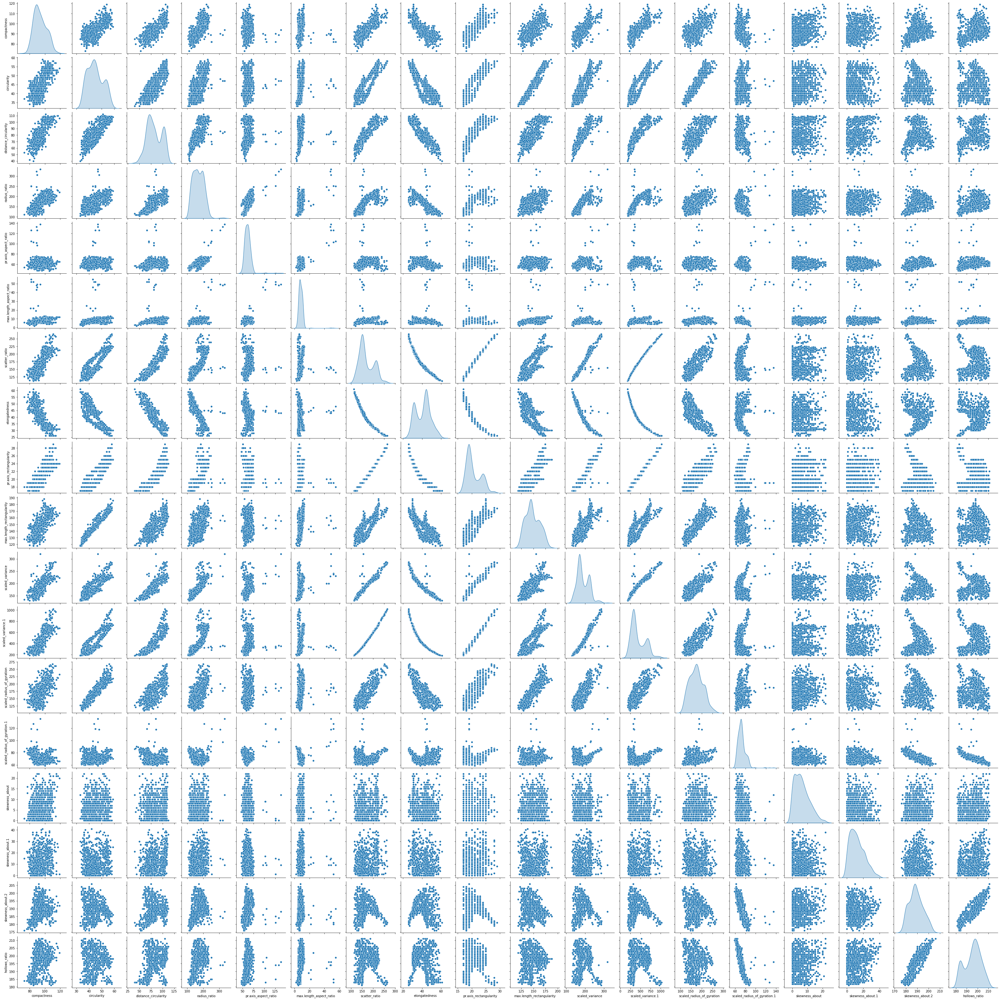

In [15]:
sns.pairplot(df3_copy,diag_kind='kde')

In [16]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
#Label Encoding the data to check correlation

In [17]:
df3_copy['class'] = LE.fit_transform(df3_copy['class'])

In [18]:
df3_copy.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0


In [19]:
df3_copy.corr()['class'].sort_values(ascending=False)

class                          1.000000
elongatedness                  0.339348
hollows_ratio                  0.235874
max.length_aspect_ratio        0.207619
skewness_about                 0.119652
skewness_about.2               0.067251
skewness_about.1              -0.010674
max.length_rectangularity     -0.032399
compactness                   -0.033796
distance_circularity          -0.065209
pr.axis_aspect_ratio          -0.098431
circularity                   -0.160546
radius_ratio                  -0.182921
scaled_radius_of_gyration.1   -0.213049
scaled_radius_of_gyration     -0.250967
pr.axis_rectangularity        -0.259102
scaled_variance.1             -0.288146
scatter_ratio                 -0.288904
scaled_variance               -0.312836
Name: class, dtype: float64

In [20]:
df3_copy.info()
#contains 846 records

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [21]:
df3_copy1 = df3_copy.dropna(axis=0)
df3_copy1.info()
# Post removing missing values we end up having 813 records, we loose only 33 rows of data. So, we can try 
#imputing the columns that miss the maximum number of data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 813 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  813 non-null    int64  
 1   circularity                  813 non-null    float64
 2   distance_circularity         813 non-null    float64
 3   radius_ratio                 813 non-null    float64
 4   pr.axis_aspect_ratio         813 non-null    float64
 5   max.length_aspect_ratio      813 non-null    int64  
 6   scatter_ratio                813 non-null    float64
 7   elongatedness                813 non-null    float64
 8   pr.axis_rectangularity       813 non-null    float64
 9   max.length_rectangularity    813 non-null    int64  
 10  scaled_variance              813 non-null    float64
 11  scaled_variance.1            813 non-null    float64
 12  scaled_radius_of_gyration    813 non-null    float64
 13  scaled_radius_of_gyr

### Filling Circularity

In [22]:
df3_copy1.corr()['circularity'].sort_values(ascending=False)

circularity                    1.000000
max.length_rectangularity      0.965366
scaled_radius_of_gyration      0.935594
scatter_ratio                  0.858149
pr.axis_rectangularity         0.856137
scaled_variance.1              0.850932
scaled_variance                0.806108
distance_circularity           0.797704
compactness                    0.689885
radius_ratio                   0.623950
max.length_aspect_ratio        0.251619
pr.axis_aspect_ratio           0.155023
skewness_about                 0.141726
hollows_ratio                  0.049331
scaled_radius_of_gyration.1    0.049070
skewness_about.1              -0.001975
skewness_about.2              -0.113902
class                         -0.161018
elongatedness                 -0.825108
Name: circularity, dtype: float64

In [23]:
LR = LinearRegression()
X = df3_copy1[['max.length_rectangularity','scaled_radius_of_gyration']]
y = df3_copy1['circularity']
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)
LR.fit(X_train,y_train)
pred = LR.predict(X_test)

In [24]:
prediction = []
for n in pred:
    prediction.append(round(n)) 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='circularity'>

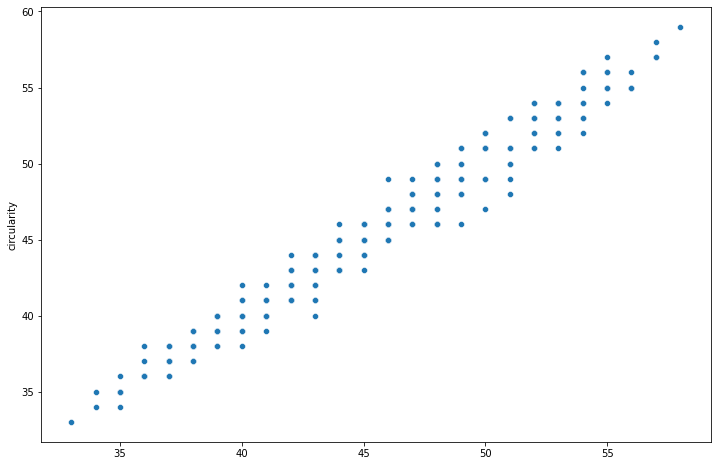

In [25]:
plt.figure(figsize=(12,8))
sns.scatterplot(prediction,y_test)
#gives us some good straight line which can be used to fill the missing values

In [26]:
#Pickling the model
pk_du9 = pickle.dump(LR,open('LR_part3.pkl','wb'))    

#loading the pickled version to predict missing values
with open('LR_part3.pkl', 'rb') as file:
    model1 = pickle.load(file)    

df3_copy['scaled_radius_of_gyration'] = df3_copy['scaled_radius_of_gyration'].fillna(value = df3_copy['scaled_radius_of_gyration'].median())    
df3_copy['circularity1'] = model1.predict(df3_copy[['max.length_rectangularity','scaled_radius_of_gyration']])
df3_copy['circularity1'] = df3_copy['circularity1'].apply(int)

In [27]:
def fill_circularity(x,y):
    if pd.isna(x):
        return y
    else:
        return x
    
    
df3_copy['circularity'] = df3_copy.apply(lambda x: fill_circularity(x['circularity'],x['circularity1']),axis=1)  
df3_copy.drop('circularity1',axis=1,inplace=True)

### We have filled Circularity and scaled_radius_of_gyration

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='radius_ratio', ylabel='Density'>

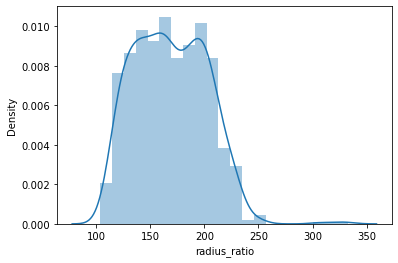

In [28]:
sns.distplot(df3_copy['radius_ratio'])
#The distribution Slightly looks like a multi modal version.

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='elongatedness', ylabel='Density'>

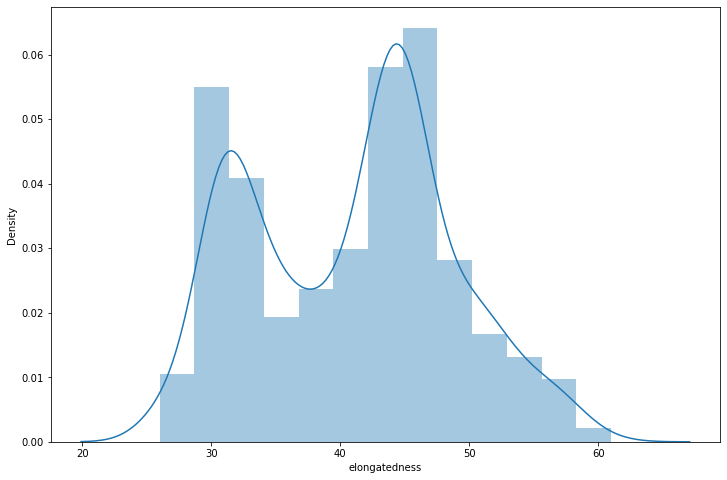

In [29]:
plt.figure(figsize=(12,8))
sns.distplot(df3_copy['elongatedness'])
#looks bimodal

In [30]:
df3_copy['elongatedness'] = df3_copy['elongatedness'].fillna(value = df3_copy['elongatedness'].median())   
#There is only 1 value missing in Elongatedness, so we fill it with median so that it does not affect the distribution

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='scaled_variance', ylabel='Density'>

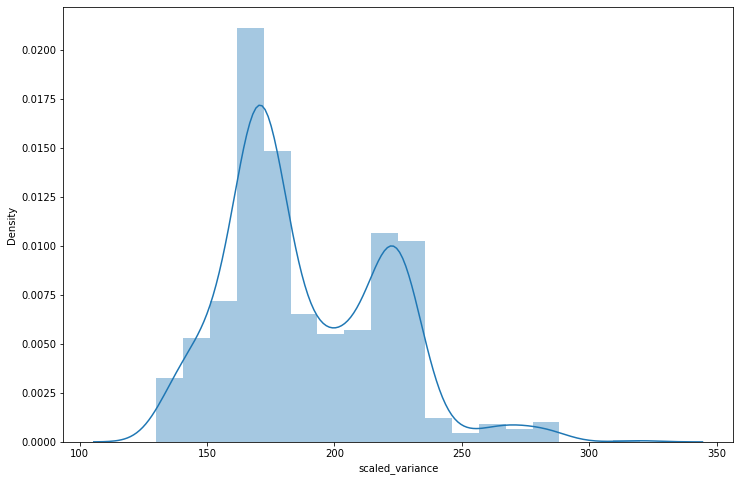

In [31]:
plt.figure(figsize=(12,8))
sns.distplot(df3_copy['scaled_variance'])
#Data is skewed and also bimodal type, it is always safe to have it filled using median

In [32]:
df3_copy['scaled_variance'] = df3_copy['scaled_variance'].fillna(value = df3_copy['scaled_variance'].median())   

In [33]:
df3_copy.corr()['radius_ratio'].sort_values(ascending=False )
#In order to fill radius ratio, we will use scaled variance and elongatedness

radius_ratio                   1.000000
scaled_variance                0.797439
distance_circularity           0.771748
scatter_ratio                  0.738480
scaled_variance.1              0.725598
pr.axis_rectangularity         0.712744
compactness                    0.691081
pr.axis_aspect_ratio           0.665363
circularity                    0.623140
max.length_rectangularity      0.571083
scaled_radius_of_gyration      0.539972
hollows_ratio                  0.472339
max.length_aspect_ratio        0.450486
skewness_about.2               0.382912
skewness_about.1               0.174469
skewness_about                 0.049112
scaled_radius_of_gyration.1   -0.181520
class                         -0.182921
elongatedness                 -0.792913
Name: radius_ratio, dtype: float64

In [34]:
df3_copy.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  0
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              2
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [35]:
Linear = LinearRegression()
X = df3_copy1[['scaled_variance','elongatedness','hollows_ratio','class','compactness','circularity','max.length_rectangularity','scaled_radius_of_gyration']]
y = df3_copy1['radius_ratio']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
Linear.fit(X_train,y_train)
predrr = Linear.predict(X_test) 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='radius_ratio'>

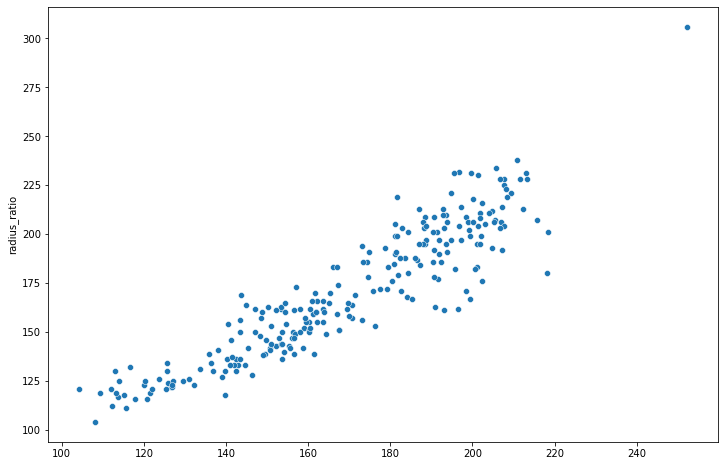

In [36]:
plt.figure(figsize=(12,8))
sns.scatterplot(predrr,y_test)
#gives us some good straight line which can be used to fill the missing values

In [37]:
#Pickling the model
pk_du10 = pickle.dump(Linear,open('LR_part33.pkl','wb'))    

#loading the pickled version to predict missing values
with open('LR_part33.pkl', 'rb') as file:
    model2 = pickle.load(file)    


df3_copy['radius_ratio1'] = model2.predict(df3_copy[['scaled_variance','elongatedness','hollows_ratio','class','compactness','circularity','max.length_rectangularity','scaled_radius_of_gyration']])
df3_copy['radius_ratio1'] = df3_copy['radius_ratio1'].apply(int)

def fill_radiusratio(x,y):
    if pd.isna(x):
        return y
    else:
        return x
    
    
df3_copy['radius_ratio'] = df3_copy.apply(lambda x: fill_radiusratio(x['radius_ratio'],x['radius_ratio1']),axis=1)  
df3_copy.drop('radius_ratio1',axis=1,inplace=True)

# We have filled radius_ratio, elongatedness and scaled_variance

In [38]:
df3_copy.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           4
radius_ratio                   0
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  0
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              2
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='skewness_about', ylabel='Density'>

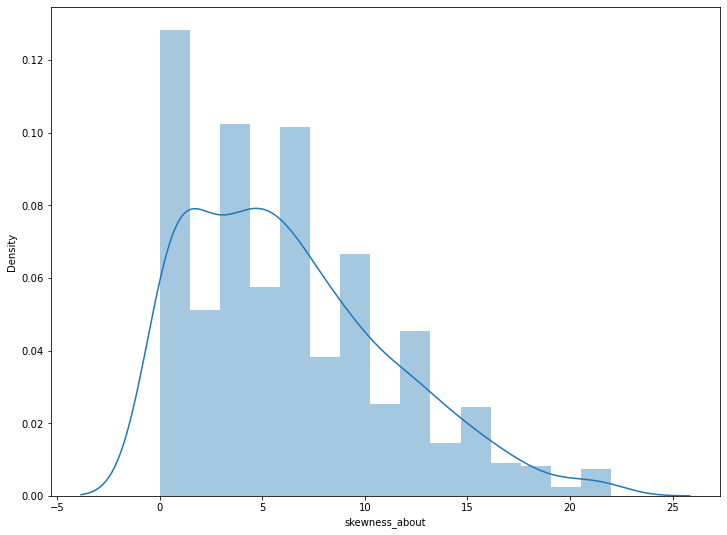

In [39]:
#focusing on skewness_about, we notice that skewness_about column is highly skewed. We will try filling the missing 
#values with median and see if the distribution changes

plt.figure(figsize=(12,9))
sns.distplot(df3_copy['skewness_about'])

In [40]:
df3_copy['skewness_about'] = df3_copy['skewness_about'].fillna(value = df3_copy['skewness_about'].median())   

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='skewness_about', ylabel='Density'>

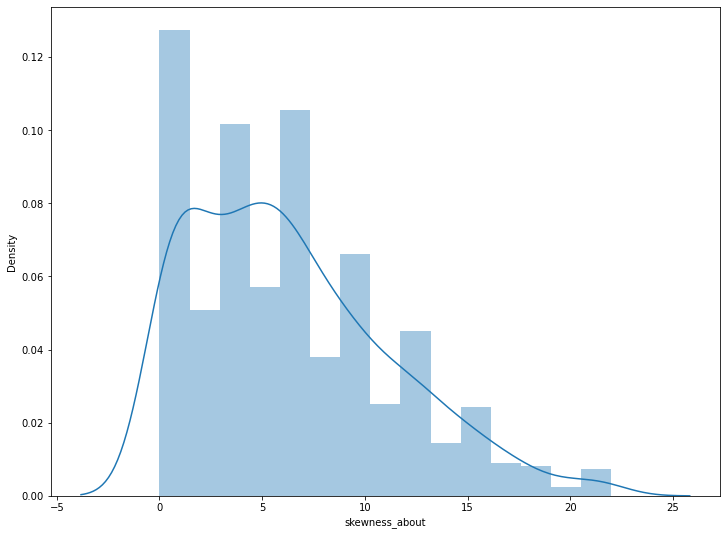

In [41]:
# There is a mild increase in frequency of median value but apart from this the distribution remains the same
plt.figure(figsize=(12,9))
sns.distplot(df3_copy['skewness_about'])

# We have filled skewness_about column

In [42]:
df3_copy.isnull().sum()
# we also fill in the single missing columns with median as majority of the data is skewed

compactness                    0
circularity                    0
distance_circularity           4
radius_ratio                   0
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  0
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              2
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    4
skewness_about                 0
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='skewness_about.1', ylabel='Density'>

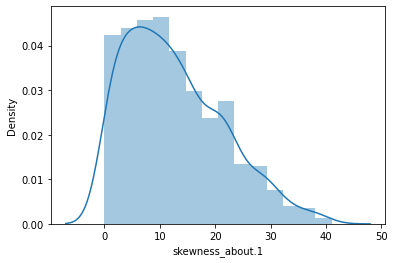

In [43]:
sns.distplot(df3_copy['skewness_about.1'])

# data is skewed, we will na with median

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='skewness_about.2', ylabel='Density'>

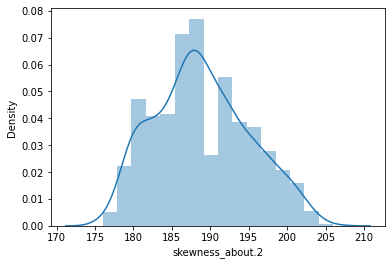

In [44]:
sns.distplot(df3_copy['skewness_about.2'])
# data is almost normally distributed, but still we will fill na with median

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='scatter_ratio', ylabel='Density'>

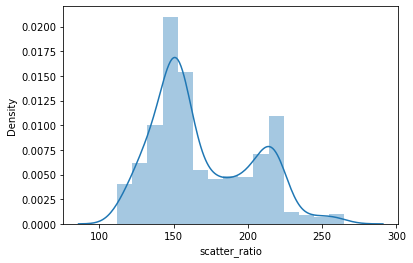

In [45]:
sns.distplot(df3_copy['scatter_ratio'])
#Bimodal distribution - in this case its better to fillin with median

In [46]:
df3_copy['skewness_about.1'] = df3_copy['skewness_about.1'].fillna(value = df3_copy['skewness_about.1'].median())   
df3_copy['skewness_about.2'] = df3_copy['skewness_about.2'].fillna(value = df3_copy['skewness_about.2'].median())   
df3_copy['scatter_ratio'] = df3_copy['scatter_ratio'].fillna(value = df3_copy['scatter_ratio'].median())   

#Filled all the 3 columns with median

In [47]:
df3_copy.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           4
radius_ratio                   0
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              2
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    4
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='scaled_radius_of_gyration.1', ylabel='Density'>

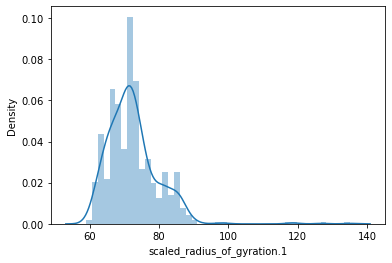

In [48]:
sns.distplot(df3_copy['scaled_radius_of_gyration.1'])
# highly right skewed, a continuous datatype

In [49]:
df3_copy.corr()['scaled_radius_of_gyration.1'].sort_values(ascending=False)

# we pick max.length_aspect_ratio, hollows_ratio, skewness_about.2 to predict the scaled_radius_of_gyration.1

scaled_radius_of_gyration.1    1.000000
max.length_aspect_ratio        0.295638
scaled_radius_of_gyration      0.191445
pr.axis_aspect_ratio           0.152860
scaled_variance                0.112867
elongatedness                  0.103594
circularity                    0.059636
max.length_rectangularity      0.041283
pr.axis_rectangularity        -0.015711
scaled_variance.1             -0.016642
scatter_ratio                 -0.027862
skewness_about                -0.088484
skewness_about.1              -0.126699
radius_ratio                  -0.179928
class                         -0.213049
distance_circularity          -0.227001
compactness                   -0.250603
skewness_about.2              -0.751484
hollows_ratio                 -0.804793
Name: scaled_radius_of_gyration.1, dtype: float64

In [50]:
Linear1 = LinearRegression()
df3_copy3 = df3_copy.dropna(axis=0)
X = df3_copy3[['max.length_aspect_ratio', 'hollows_ratio', 'skewness_about.2']]
y = df3_copy3['scaled_radius_of_gyration.1']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
Linear1.fit(X_train,y_train)
predrr1 = Linear1.predict(X_test) 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='scaled_radius_of_gyration.1'>

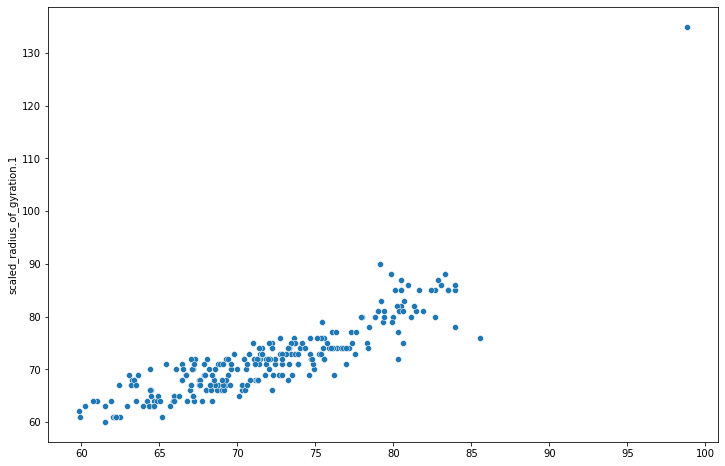

In [51]:
plt.figure(figsize=(12,8))
sns.scatterplot(predrr1,y_test)
#gives us some good straight line(almost a straight line) except 1 point that looks like outlier. So, we use this 
# impute missing scaled_radius_of_gyration.1 column

In [52]:
# Pickling the model
pk_du11 = pickle.dump(Linear1,open('LR_part331.pkl','wb'))    

#loading the pickled version to predict missing values
with open('LR_part331.pkl', 'rb') as file:
    model3 = pickle.load(file)    


df3_copy['scaled_radius_of_gyration.11'] = model3.predict(df3_copy[['max.length_aspect_ratio', 'hollows_ratio', 'skewness_about.2']])
df3_copy['scaled_radius_of_gyration.11'] = df3_copy['scaled_radius_of_gyration.11'].apply(int)

def fill_scaled_radius_of_gyration(x,y):
    if pd.isna(x):
        return y
    else:
        return x
    
    
df3_copy['scaled_radius_of_gyration.1'] = df3_copy.apply(lambda x: fill_scaled_radius_of_gyration(x['scaled_radius_of_gyration.1'],x['scaled_radius_of_gyration.11']),axis=1)  
df3_copy.drop('scaled_radius_of_gyration.11',axis=1,inplace=True)

#  scaled_radius_of_gyration.1 column is filled

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='distance_circularity', ylabel='Density'>

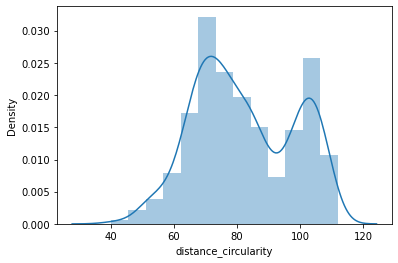

In [53]:
sns.distplot(df3_copy['distance_circularity'])
# data seems to be a bimodal type and is also left skewed

In [54]:
df3_copy.isnull().sum().sort_values(ascending=False)

distance_circularity           4
pr.axis_rectangularity         3
pr.axis_aspect_ratio           2
scaled_variance.1              2
class                          0
circularity                    0
radius_ratio                   0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
max.length_rectangularity      0
hollows_ratio                  0
scaled_variance                0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
compactness                    0
dtype: int64

In [55]:
df3_copy.corr()['distance_circularity'].sort_values(ascending=False)

distance_circularity           1.000000
scatter_ratio                  0.906825
pr.axis_rectangularity         0.896273
scaled_variance.1              0.890541
scaled_variance                0.863963
circularity                    0.798783
compactness                    0.791707
max.length_rectangularity      0.775149
radius_ratio                   0.772089
scaled_radius_of_gyration      0.706500
hollows_ratio                  0.333648
skewness_about.1               0.265480
max.length_aspect_ratio        0.264621
pr.axis_aspect_ratio           0.158684
skewness_about.2               0.146106
skewness_about                 0.114628
class                         -0.065209
scaled_radius_of_gyration.1   -0.229062
elongatedness                 -0.912872
Name: distance_circularity, dtype: float64

In [56]:
Linear2 = LinearRegression()
df3_copy4 = df3_copy.dropna(axis=0)
X = df3_copy3[['scatter_ratio', 'circularity', 'scaled_variance','elongatedness']]
y = df3_copy3['distance_circularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
Linear2.fit(X_train,y_train)
predrr2 = Linear2.predict(X_test) 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='distance_circularity'>

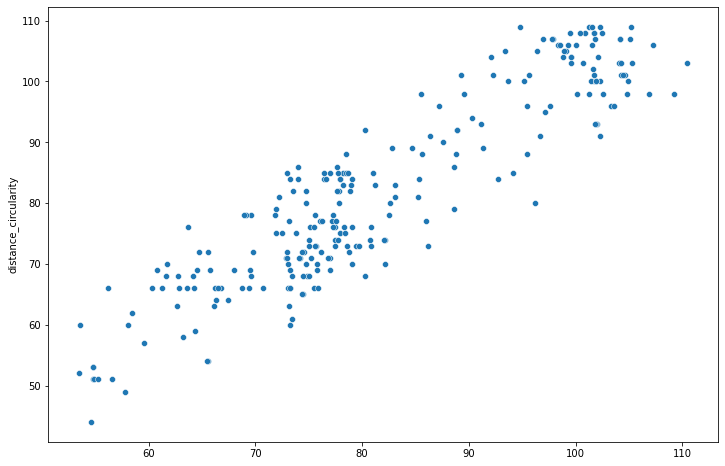

In [57]:
plt.figure(figsize=(12,8))
sns.scatterplot(predrr2,y_test)
# gives us some good straight line(almost a straight line) except few points that is scattered. So, we use this 
# impute missing distance_circularity column

In [58]:
# Pickling the model
pk_du111 = pickle.dump(Linear2,open('LR_part332.pkl','wb'))    

#loading the pickled version to predict missing values
with open('LR_part332.pkl', 'rb') as file:
    model4 = pickle.load(file)    


df3_copy['distance_circularity1'] = model4.predict(df3_copy[['scatter_ratio', 'circularity', 'scaled_variance','elongatedness']])
df3_copy['distance_circularity1'] = df3_copy['distance_circularity1'].apply(int)

def distance_circularity(x,y):
    if pd.isna(x):
        return y
    else:
        return x
    
    
df3_copy['distance_circularity'] = df3_copy.apply(lambda x: distance_circularity(x['distance_circularity'],x['distance_circularity1']),axis=1)  
df3_copy.drop('distance_circularity1',axis=1,inplace=True)

# We have also filled distance_circularity

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='pr.axis_rectangularity', ylabel='Density'>

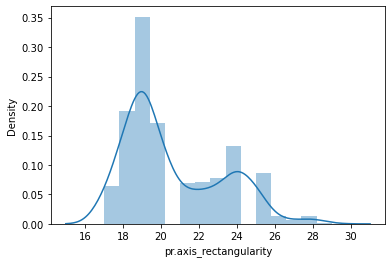

In [59]:
sns.distplot(df3_copy['pr.axis_rectangularity'])

In [60]:
df3_copy.isnull().sum().sort_values(ascending=False)
# we have only 3 feature missed

pr.axis_rectangularity         3
pr.axis_aspect_ratio           2
scaled_variance.1              2
class                          0
circularity                    0
distance_circularity           0
radius_ratio                   0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
max.length_rectangularity      0
hollows_ratio                  0
scaled_variance                0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
compactness                    0
dtype: int64

In [61]:
df3_copy.corr()['pr.axis_rectangularity'].sort_values(ascending=False)

pr.axis_rectangularity         1.000000
scaled_variance.1              0.992316
scatter_ratio                  0.991464
scaled_variance                0.935648
distance_circularity           0.896526
circularity                    0.858028
compactness                    0.814248
max.length_rectangularity      0.813135
scaled_radius_of_gyration      0.798218
radius_ratio                   0.713150
skewness_about.1               0.214459
max.length_aspect_ratio        0.161603
hollows_ratio                  0.099481
skewness_about                 0.083313
pr.axis_aspect_ratio           0.079566
scaled_radius_of_gyration.1   -0.017206
skewness_about.2              -0.018876
class                         -0.259102
elongatedness                 -0.950408
Name: pr.axis_rectangularity, dtype: float64

In [62]:
Linear3 = LinearRegression()
df3_copy5 = df3_copy.dropna(axis=0)
X = df3_copy3[['scatter_ratio', 'circularity', 'scaled_variance','elongatedness','distance_circularity']]
y = df3_copy3['pr.axis_rectangularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
Linear3.fit(X_train,y_train)
predrr3 = Linear3.predict(X_test) 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='pr.axis_rectangularity'>

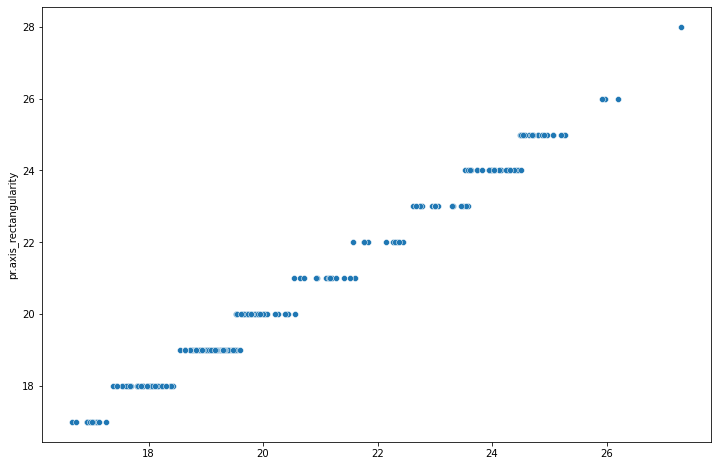

In [63]:
plt.figure(figsize=(12,8))
sns.scatterplot(predrr3,y_test)
# gives us some good straight line(almost a straight line) except few points that is scattered. So, we use this 
# impute missing distance_circularity column

In [64]:
# Pickling the model
pk_du1111 = pickle.dump(Linear3,open('LR_part333.pkl','wb'))    

#loading the pickled version to predict missing values
with open('LR_part333.pkl', 'rb') as file:
    model5 = pickle.load(file)    


df3_copy['pr.axis_rectangularity1'] = model5.predict(df3_copy[['scatter_ratio', 'circularity', 'scaled_variance','elongatedness','distance_circularity']])
df3_copy['pr.axis_rectangularity1'] = df3_copy['pr.axis_rectangularity1'].apply(int)

def distance_rectangularity(x,y):
    if pd.isna(x):
        return y
    else:
        return x
    
    
df3_copy['pr.axis_rectangularity'] = df3_copy.apply(lambda x: distance_rectangularity(x['pr.axis_rectangularity'],x['pr.axis_rectangularity1']),axis=1)  
df3_copy.drop('pr.axis_rectangularity1',axis=1,inplace=True)

# We have filled pr.axis_rectangularity column

In [65]:
df3_copy.isnull().sum().sort_values(ascending=False)

pr.axis_aspect_ratio           2
scaled_variance.1              2
class                          0
pr.axis_rectangularity         0
circularity                    0
distance_circularity           0
radius_ratio                   0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
max.length_rectangularity      0
hollows_ratio                  0
scaled_variance                0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
compactness                    0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='pr.axis_aspect_ratio', ylabel='Density'>

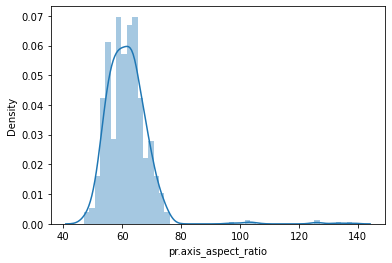

In [66]:
sns.distplot(df3_copy['pr.axis_aspect_ratio'])

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='scaled_variance.1', ylabel='Density'>

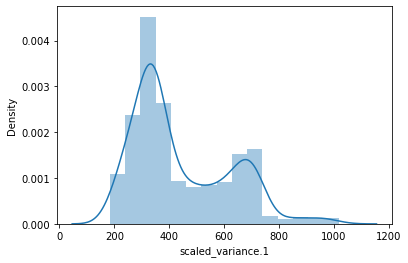

In [67]:
sns.distplot(df3_copy['scaled_variance.1'])

In [68]:
df3_copy['pr.axis_aspect_ratio'] = df3_copy['pr.axis_aspect_ratio'].fillna(value = df3_copy['pr.axis_aspect_ratio'].median())   
df3_copy['scaled_variance.1'] = df3_copy['scaled_variance.1'].fillna(value = df3_copy['scaled_variance.1'].median())   

In [69]:
df3_copy.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

# All  the missing values have been filled

### We haven't missed any of the missing values by dropping them

In [73]:
df3_copy.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0


In [75]:
df3_copy.corr()['class'].sort_values(ascending=False)

class                          1.000000
elongatedness                  0.339344
hollows_ratio                  0.235874
max.length_aspect_ratio        0.207619
skewness_about                 0.119581
skewness_about.2               0.067244
skewness_about.1              -0.010680
max.length_rectangularity     -0.032399
compactness                   -0.033796
distance_circularity          -0.065436
pr.axis_aspect_ratio          -0.098178
circularity                   -0.164080
radius_ratio                  -0.185317
scaled_radius_of_gyration.1   -0.214352
scaled_radius_of_gyration     -0.250267
pr.axis_rectangularity        -0.258665
scaled_variance.1             -0.288115
scatter_ratio                 -0.288895
scaled_variance               -0.312943
Name: class, dtype: float64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='class', ylabel='count'>

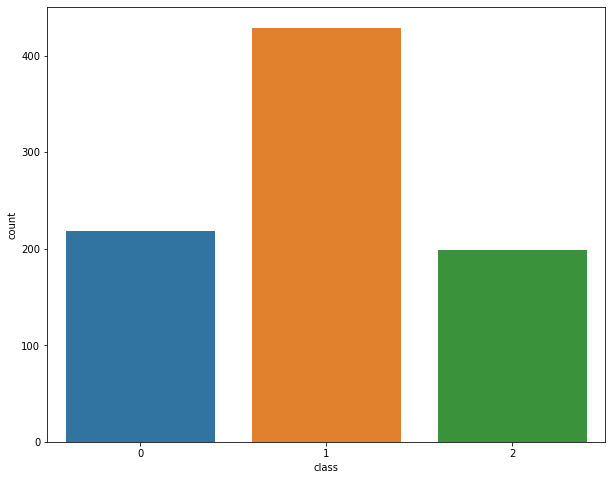

In [78]:
plt.figure(figsize=(10,8))
sns.countplot(df3_copy['class'])
#There are more of class 1 data

In [79]:
df3_copy['class'].value_counts(normalize=True)
#The difference in classes is not muchbut later we will try to balance them if the final metrics arent good.

1    0.507092
0    0.257683
2    0.235225
Name: class, dtype: float64

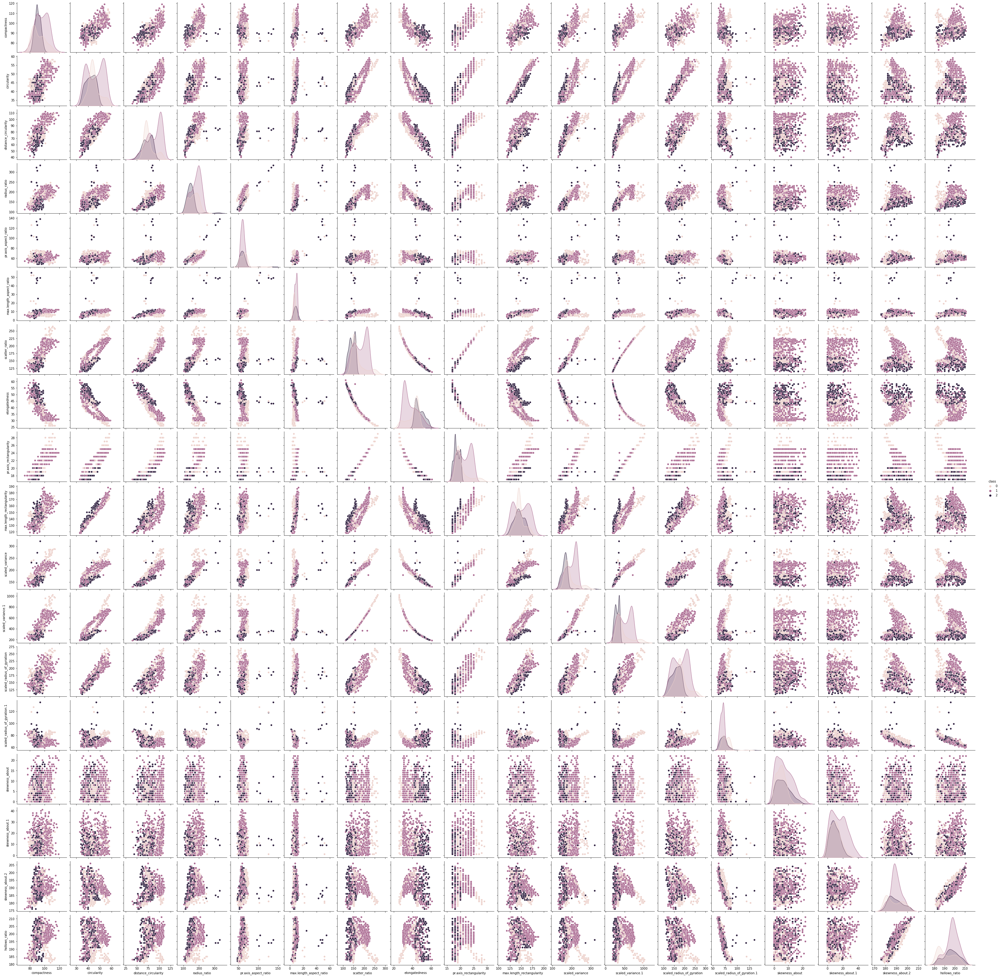

In [85]:
sns.pairplot(df3_copy,hue='class')
# We can see a lot of multi collinearity problem, most of the independent features are correlated with other features
# This was noticed while filling the missing values

# Design and train a best fit SVM classier using all the data attributes.

In [92]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split,KFold,GridSearchCV,StratifiedKFold

In [89]:
X = df3_copy.drop('class',axis=1)
y = df3_copy['class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [98]:
svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv.fit(X_train,y_train)
pred = gcv.predict(X_test)

print(classification_report(y_test,pred))

confusion_matrix(y_test,pred)

#CLass 2 seems to have a very bad metric score so we will up sample or SMOTE the data and retry the same process

              precision    recall  f1-score   support

           0       1.00      0.34      0.51        67
           1       0.58      1.00      0.73       129
           2       1.00      0.14      0.24        58

    accuracy                           0.63       254
   macro avg       0.86      0.49      0.50       254
weighted avg       0.79      0.63      0.56       254



array([[ 23,  44,   0],
       [  0, 129,   0],
       [  0,  50,   8]], dtype=int64)

In [99]:
gcv.best_params_

{'C': 1.5, 'gamma': 0.01}

# Balancing the classes using Oversampling and SMOTE technique

In [111]:
from imblearn.over_sampling import RandomOverSampler,SMOTE
from imblearn.combine import SMOTETomek

SM = SMOTE("auto")
OS = RandomOverSampler(sampling_strategy='auto')

X_OS, y_OS= OS.fit_resample(X,y)
print(f"The classes balanced after Oversampling \n\n{y_OS.value_counts()} \n\nbefore sampling\n{y.value_counts()} ")

X_SM, y_SM= SM.fit_resample(X,y)
print(f"The classes balanced after SMOTE \n\n{y_SM.value_counts()} \n\nbefore sampling\n{y.value_counts()} ")

The classes balanced after Oversampling 

2    429
1    429
0    429
Name: class, dtype: int64 

before sampling
1    429
0    218
2    199
Name: class, dtype: int64 
The classes balanced after SMOTE 

2    429
1    429
0    429
Name: class, dtype: int64 

before sampling
1    429
0    218
2    199
Name: class, dtype: int64 


C:\Users\kragha\Anaconda3\lib\site-packages\imblearn\utils\_validation.py:587: FutureWarning:

Pass sampling_strategy=auto as keyword args. From version 0.9 passing these as positional arguments will result in an error



In [228]:
X_train_OS, X_test_OS, y_train_OS, y_test_OS = train_test_split(X_OS, y_OS, test_size=0.3, random_state=101)

svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv_OS = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv_OS.fit(X_train_OS,y_train_OS)
pred = gcv_OS.predict(X_test_OS)

print(classification_report(y_test_OS,pred))

confusion_matrix(y_test_OS,pred)

print(gcv_OS.best_params_)

              precision    recall  f1-score   support

           0       1.00      0.80      0.89       127
           1       0.72      1.00      0.83       123
           2       1.00      0.82      0.90       137

    accuracy                           0.87       387
   macro avg       0.91      0.88      0.88       387
weighted avg       0.91      0.87      0.88       387

{'C': 1.5, 'gamma': 0.01}


In [115]:
X_train_SM, X_test_SM, y_train_SM, y_test_SM = train_test_split(X_SM, y_SM, test_size=0.3, random_state=101)

svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv_SM = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv_SM.fit(X_train_SM,y_train_SM)
pred = gcv_SM.predict(X_test_SM)

print(classification_report(y_test_SM,pred))

confusion_matrix(y_test_SM,pred)

print(gcv_SM.best_params_)

              precision    recall  f1-score   support

           0       0.99      0.79      0.88       127
           1       0.68      1.00      0.81       123
           2       1.00      0.77      0.87       137

    accuracy                           0.85       387
   macro avg       0.89      0.85      0.85       387
weighted avg       0.90      0.85      0.85       387

{'C': 1.5, 'gamma': 0.01}


# Oversampling version gives us a good model with a good F1 score

# Dimensional reduction: perform dimensional reduction on the data.

# 1. Scale the data by using Standarad scaler or Z score

In [171]:
#Scaling the data using Standarad Scaler
PCASS = StandardScaler()
# df3_copy.apply(PCASS)
X = df3_copy.drop('class',axis=1)
y = df3_copy['class']
df3_copy_transform = PCASS.fit_transform(X)
pca_raw = pd.DataFrame(df3_copy_transform,columns=df3_copy.columns[:-1])
pca_raw

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.508950,0.056651,0.269842,1.310398,0.311542,-0.207598,0.136262,-0.224406,0.758332,-0.401920,-0.341934,0.285705,-0.329712,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.626268,0.120129,-0.836747,-0.593753,0.094079,-0.599423,0.520519,-0.610274,-0.344578,-0.593357,-0.619724,-0.513630,-0.062147,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.833298,1.516661,1.196984,0.548738,0.311542,1.148719,-1.144597,0.933200,0.689401,1.097671,1.109379,1.392477,0.071635,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.626268,-0.006828,-0.298406,0.167907,0.094079,-0.750125,0.648605,-0.610274,-0.344578,-0.912419,-0.738777,-1.466683,-1.266190,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.139746,-0.768573,1.077353,5.245643,9.444962,-0.599423,0.520519,-0.610274,-0.275646,1.671982,-0.648070,0.408680,7.295895,0.538390,-0.179311,-1.450481,-1.699181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,-0.082445,-0.950615,0.310565,0.419381,0.294851,-0.123383,0.003385,-0.119910,-0.224406,-0.964965,0.363829,-0.098159,-0.790323,-0.062147,0.130256,1.389197,-0.149374,-0.085062
842,-0.568495,0.184602,0.120129,-0.178775,0.548738,0.529004,-0.298019,0.264347,-0.224406,0.758332,-0.497638,-0.404295,0.039756,-0.062147,-1.094148,0.829015,-0.474650,0.183957
843,1.497218,1.481994,1.199267,1.585785,0.675681,0.746467,1.600825,-1.400769,1.704937,1.723379,1.257202,1.596929,0.777604,-0.329712,-0.686013,-0.963565,-0.312012,0.721997
844,-0.933032,-1.437137,-0.260743,-0.687208,-0.466810,-0.340845,-1.021388,1.160948,-0.996143,-1.654284,-1.071950,-0.959876,-0.821066,-0.864843,-1.298215,1.389197,0.175903,-0.085062


In [135]:
#Scaling the data using Standarad Scaler, both look the same
from scipy.stats import zscore
PCA_raw_1=X.apply(zscore)
PCA_raw_1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.508950,0.056651,0.269842,1.310398,0.311542,-0.207598,0.136262,-0.224406,0.758332,-0.401920,-0.341934,0.285705,-0.329712,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.626268,0.120129,-0.836747,-0.593753,0.094079,-0.599423,0.520519,-0.610274,-0.344578,-0.593357,-0.619724,-0.513630,-0.062147,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.833298,1.516661,1.196984,0.548738,0.311542,1.148719,-1.144597,0.933200,0.689401,1.097671,1.109379,1.392477,0.071635,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.626268,-0.006828,-0.298406,0.167907,0.094079,-0.750125,0.648605,-0.610274,-0.344578,-0.912419,-0.738777,-1.466683,-1.266190,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.139746,-0.768573,1.077353,5.245643,9.444962,-0.599423,0.520519,-0.610274,-0.275646,1.671982,-0.648070,0.408680,7.295895,0.538390,-0.179311,-1.450481,-1.699181


In [140]:
from sklearn.decomposition import PCA
pca = PCA(n_components=18)
pca.fit(pca_raw)
# First we will create PCA using all the dimensions to know the variance explained by the eigen values
#Without balancing the dataset

PCA(n_components=18)

In [147]:
print(pca.explained_variance_)
#The explained variance

[9.42857886e+00 3.02218498e+00 1.90212412e+00 1.18004521e+00
 9.17038535e-01 5.34010470e-01 3.55772167e-01 2.20696029e-01
 1.58998185e-01 9.14295866e-02 6.39791167e-02 4.52859792e-02
 3.59424518e-02 2.31953611e-02 1.77893872e-02 1.32515988e-02
 8.06809377e-03 2.91165029e-03]


In [142]:
print(pca.components_)
# The eigen vectors

[[ 2.74886167e-01  2.95179069e-01  3.04654165e-01  2.67928140e-01
   7.98994596e-02  9.67654505e-02  3.16887274e-01 -3.13785937e-01
   3.14086928e-01  2.82460286e-01  3.09059294e-01  3.13671592e-01
   2.71917100e-01 -2.10976894e-02  4.14220430e-02  5.78418533e-02
   2.99185668e-02  7.34717204e-02]
 [-1.27567368e-01  1.29620069e-01 -7.36966655e-02 -1.89220676e-01
  -1.22457477e-01  1.02201337e-02  4.71779342e-02  1.36364815e-02
   6.03250828e-02  1.15375750e-01  6.11472224e-02  5.28615338e-02
   2.08516882e-01  4.89003211e-01 -5.49590008e-02 -1.24606284e-01
  -5.40436225e-01 -5.39881080e-01]
 [-1.19514280e-01 -2.98270119e-02 -5.53951693e-02  2.74151123e-01
   6.42513538e-01  5.92363603e-01 -9.64325553e-02  5.64509272e-02
  -1.08830549e-01 -1.68469378e-02  5.76151227e-02 -1.07671872e-01
  -3.08754759e-02  2.86095605e-01 -1.16297499e-01 -7.37063730e-02
   8.26015335e-03  3.90434769e-02]
 [ 7.89928335e-02  1.85300149e-01 -7.13532301e-02 -4.25928162e-02
   3.47765306e-02  3.31721318e-02 -9.

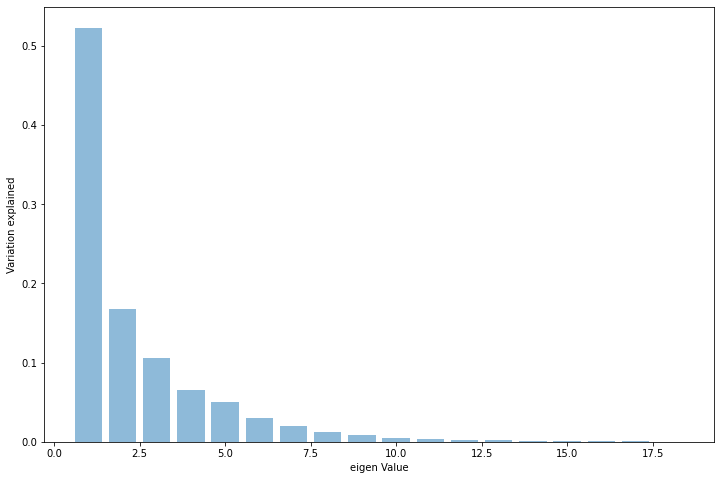

In [148]:
plt.figure(figsize=(12,8))
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()


In [161]:
np.sort(pca.explained_variance_ratio_)[::-1]
#The first three dimensions explain a lot of variance, from 4th we get a very low variance (<0.1) explained 
# so lets proceed with only 3 dimensions

array([5.23190776e-01, 1.67700703e-01, 1.05548652e-01, 6.54805752e-02,
       5.08863647e-02, 2.96321806e-02, 1.97417574e-02, 1.22463977e-02,
       8.82279134e-03, 5.07341743e-03, 3.55019396e-03, 2.51291387e-03,
       1.99444259e-03, 1.28710797e-03, 9.87131084e-04, 7.35329719e-04,
       4.47697612e-04, 1.61567146e-04])

# Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

# With Unbalanced Dataset

In [181]:
pca = PCA(n_components=3)
SSC_U = StandardScaler()
X_train = SSC_U.fit_transform(X_train)
X_test = SSC_U.fit_transform(X_test)
PCA_train = pca.fit_transform(X_train)
PCA_test = pca.fit_transform(X_test)


In [183]:
svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv.fit(PCA_train,y_train)
print("The training data score is {}".format(gcv.score(PCA_train,y_train)))
print("The testing data score is {}".format(gcv.score(PCA_test,y_test)))

pred = gcv.predict(PCA_test)

print(classification_report(pred,y_test))

confusion_matrix(pred,y_test)



#CLass 2 seems to have a very bad metric score so we will up sample or SMOTE the data and retry the same process

The training data score is 0.7618243243243243
The training data score is 0.7086614173228346
              precision    recall  f1-score   support

           0       0.64      0.68      0.66        63
           1       0.84      0.78      0.81       139
           2       0.48      0.54      0.51        52

    accuracy                           0.71       254
   macro avg       0.66      0.67      0.66       254
weighted avg       0.72      0.71      0.71       254



array([[ 43,  11,   9],
       [  9, 109,  21],
       [ 15,   9,  28]], dtype=int64)

# Applying Oversampling 

In [211]:
pca = PCA(n_components=3)
SSC_U = StandardScaler()
X_train_OS = SSC_U.fit_transform(X_train_OS)
X_test_OS = SSC_U.fit_transform(X_test_OS)
PCA_train_OS = pca.fit_transform(X_train_OS)
PCA_test_OS = pca.fit_transform(X_test_OS)


In [212]:
svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv.fit(PCA_train_OS,y_train_OS)
print("The training data score is {}".format(gcv.score(PCA_train_OS,y_train_OS)))
print("The testing data score is {}".format(gcv.score(PCA_test_OS,y_test_OS)))

pred = gcv.predict(PCA_test_OS)

print(classification_report(pred,y_test_OS))

confusion_matrix(pred,y_test_OS)



#Oversampling data dint help us much

The training data score is 0.7444444444444445
The testing data score is 0.42377260981912146
              precision    recall  f1-score   support

           0       0.30      0.35      0.32       108
           1       0.35      0.53      0.42        81
           2       0.61      0.42      0.50       198

    accuracy                           0.42       387
   macro avg       0.42      0.43      0.41       387
weighted avg       0.47      0.42      0.43       387



array([[38, 33, 37],
       [21, 43, 17],
       [68, 47, 83]], dtype=int64)

# Applying SMOTE Tomek

In [207]:
pca = PCA(n_components=3)
SSC_U = StandardScaler()
X_train_SM = SSC_U.fit_transform(X_train_SM)
X_test_SM = SSC_U.fit_transform(X_test_SM)
PCA_train_SM = pca.fit_transform(X_train_SM)
PCA_test_SM = pca.fit_transform(X_test_SM)


In [208]:
svc = SVC()
SKF = StratifiedKFold(n_splits=10)
gcv = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
gcv.fit(PCA_train_SM,y_train_SM)
print("The training data score is {}".format(gcv.score(PCA_train_SM,y_train_SM)))
print("The testing data score is {}".format(gcv.score(PCA_test_SM,y_test_SM)))

pred = gcv.predict(PCA_test_SM)

print(classification_report(pred,y_test_SM))

confusion_matrix(pred,y_test_SM)



#SMOTE TOmek balanced classes gives us the best  score so we will take SMOTE TOMEK balanced dataset

The training data score is 0.7688888888888888
The testing data score is 0.7183462532299741
              precision    recall  f1-score   support

           0       0.68      0.75      0.71       115
           1       0.65      0.77      0.70       104
           2       0.82      0.67      0.73       168

    accuracy                           0.72       387
   macro avg       0.72      0.73      0.72       387
weighted avg       0.73      0.72      0.72       387



array([[ 86,  12,  17],
       [ 16,  80,   8],
       [ 25,  31, 112]], dtype=int64)

# Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

In [227]:
for n in range(3,16):
    pca = PCA(n_components=n)
    SSC_U = StandardScaler()
    X_train_SM = SSC_U.fit_transform(X_train_SM)
    X_test_SM = SSC_U.fit_transform(X_test_SM)
    PCA_train_SM = pca.fit_transform(X_train_SM)
    PCA_test_SM = pca.fit_transform(X_test_SM)
    svc = SVC()
    SKF = StratifiedKFold(n_splits=10)
    gcv = GridSearchCV(estimator = svc,param_grid = {'gamma':[0.01,0.02,0.03,0.04], 'C':[1,1.5,2,2.5,3,3.5,4]},n_jobs = 5,cv=SKF)
    gcv.fit(PCA_train_SM,y_train_SM)
    print("The training data score is {}".format(gcv.score(PCA_train_SM,y_train_SM)))
    print("The testing data score is {}".format(gcv.score(PCA_test_SM,y_test_SM)))

    pred = gcv.predict(PCA_test_SM)

    print(classification_report(pred,y_test_SM))

    confusion_matrix(pred,y_test_SM)
    print("n is {}".format(n))

#SMOTE TOmek balanced classes with N_Components as 12 gives the best scores

The training data score is 0.7688888888888888
The testing data score is 0.7183462532299741
              precision    recall  f1-score   support

           0       0.68      0.75      0.71       115
           1       0.65      0.77      0.70       104
           2       0.82      0.67      0.73       168

    accuracy                           0.72       387
   macro avg       0.72      0.73      0.72       387
weighted avg       0.73      0.72      0.72       387

n is 3
The training data score is 0.8188888888888889
The testing data score is 0.7416020671834626
              precision    recall  f1-score   support

           0       0.69      0.75      0.72       116
           1       0.70      0.77      0.74       111
           2       0.83      0.71      0.77       160

    accuracy                           0.74       387
   macro avg       0.74      0.75      0.74       387
weighted avg       0.75      0.74      0.74       387

n is 4
The training data score is 0.8211111111111

### Usually a Dimensionality reduction technique will help by reducing the computational time, multicollinearity issues,  Avoids curse of dimensionality and also reduces overfitting

### But here we notice that Dimensionality reduction technique does not add much effect if we keep the PCA components as 3.

### With over 18 columns as inputs, if we use n_components as 3 we get a bad score in training and also in testing. If we could improve the n_components to 9 or 12 we  end up getting better results.

### I would prefer taking the complete dataset, balance the classes Using SMOTE TOMEK technique, apply PCA technique and reduce the dimensions to 9  from 18 dimensions and  use Support vector classifier with GridsearchCV with Stratified CV to get the best output.

### Although the Dimensionality reduction technique might look appropriate if 18 columns are reduced to 3 or 4 but here it works well for 9 dimensions which is half the size of original dataset.

### When we dint apply dimensionality reduction  we got :

## Without PCA

#### With Oversampled data : F1 score of 89% for class0, 83% for class1, 90% for class2  was achieved --> Best Model!!
#### With SMOTE data : we got F1 score of  88% for class0, 81% for class1, 87% for class2 was achieved

## With PCA - We got the best output in SMOTE balanced data:

#### We got  F1 score of 95% for Class0, 89% for class1, 91% for class2.

## So, we get the best model when PCA is applied 

### N=9 is the least dimension and also has a better result


# Part 4 - Sports Management

In [95]:
df4 = pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")

In [96]:
df4.isnull().sum()
# We see that 90 rows of data is null

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [97]:
df4.info()
#Totally there are 180 rows of data out of which 90 rows of data is null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [98]:
df4_copy = df4.copy()

# Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

### 1. The null / missing values look like blanks everywhere so if identified as blanks we can drop all of them 

In [99]:
df4_copy[pd.isna(df4_copy['Name'])]
#As mentioned all rows that are null are completely null throughout and also it is in alternative positions.
#I feel this could be a blank row after every row, so we are dropping the nulls

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
170,NaN,NaN,NaN,NaN,NaN,NaN,NaN
172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
df4_copy.dropna(axis=0,inplace=True)

In [101]:
df4_copy.isnull().sum()
#Nulls dropped

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Runs', ylabel='Density'>

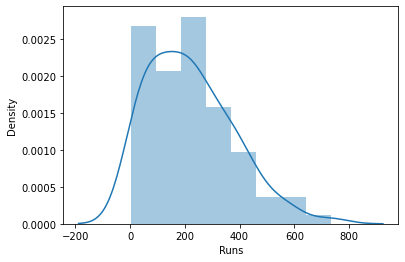

In [102]:
sns.distplot(df4_copy['Runs'])

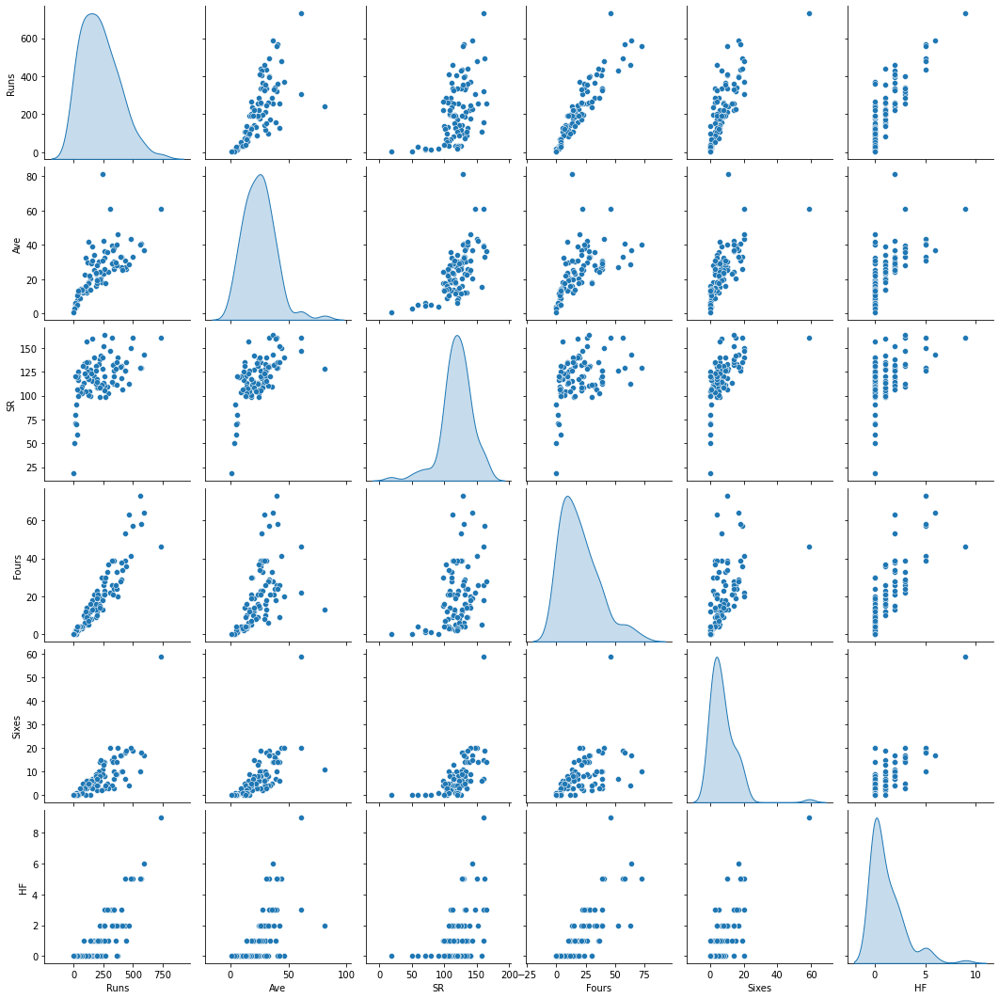

In [11]:
sns.pairplot(df4_copy,diag_kind='kde')
# we create a pairplot to view the correlation of all columns against each other 

# 1. Univariate Bivariate Multivariate analysis

In [103]:
df4_copy.corr()['Runs'].sort_values(ascending=False)

#1. We notice that the more a player scores 4's the more they score but the sixes have comparitively lesser 
# contribution

#2.Through correlation we notice that with the increase in number of half centuries, there is increase in runs. 
#  Which is obvious as the more you score half centuries the more your total runs increases

Runs     1.000000
Fours    0.918809
HF       0.835148
Sixes    0.769778
Ave      0.692984
SR       0.493489
Name: Runs, dtype: float64

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Fours', ylabel='Runs'>

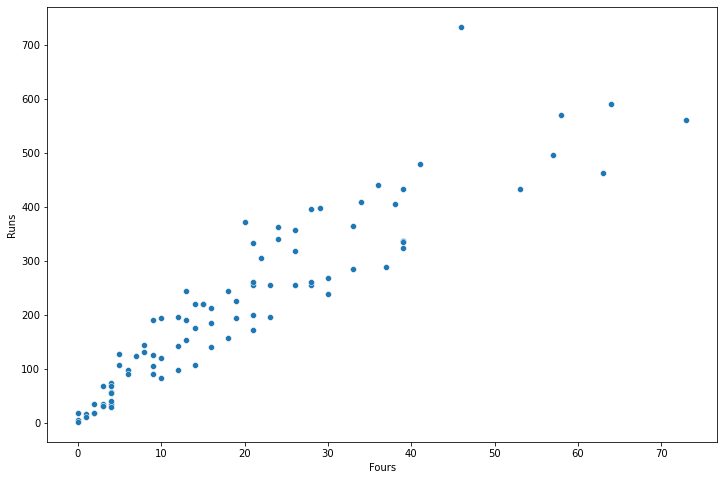

In [104]:
plt.figure(figsize=(12,8))
sns.scatterplot(df4_copy['Fours'],df4_copy['Runs'])
#It can be seen here that the more 4's scored the more runs 

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Sixes', ylabel='Runs'>

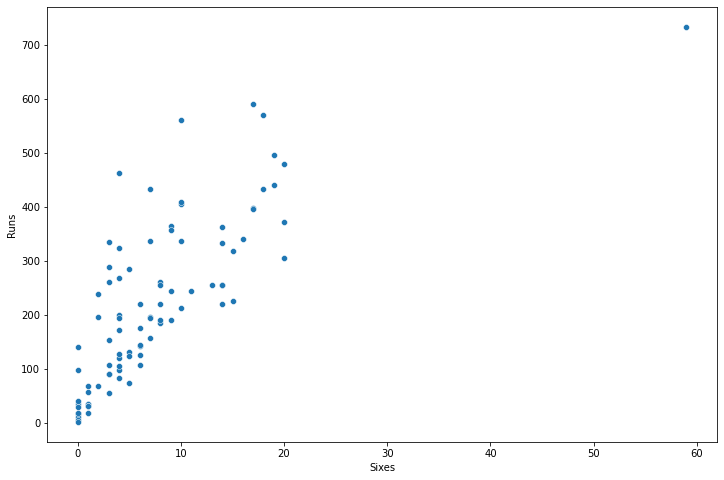

In [105]:
plt.figure(figsize=(12,8))
sns.scatterplot(df4_copy['Sixes'],df4_copy['Runs'])
#The players who score sixes are not highly correlated with the runs as 6's lead to catches whereas 4's dont

#A six is when a ball does not make contact on ground till it crosses the boundary line, in the path of trying
#to hit six, people usually get out which stalls the increase in runs but if six is scored then it adds more runs.

#In other case, when a person scores 4, it is known that a ball can make any number of contact on ground and then
#cross the boundary line, this clearly shows that the chances of getting out is lesser and also the chances of
#scoring runs is more. If one has to choose between 4 and 6, peoplen always go for 4 as it is the safest way to
#score higher runs in a ball

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='HF', ylabel='Runs'>

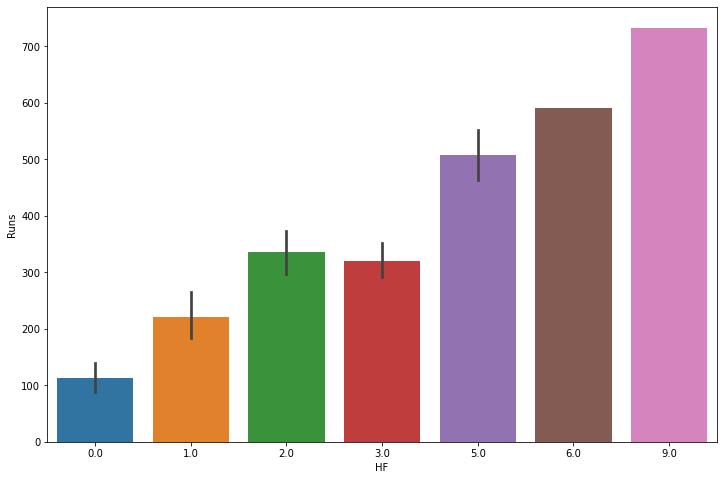

In [106]:
plt.figure(figsize=(12,8))
sns.barplot('HF','Runs',data = df4_copy)
#We clearly notice the increase in runs with more half centuries

C:\Users\kragha\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Ave', ylabel='Runs'>

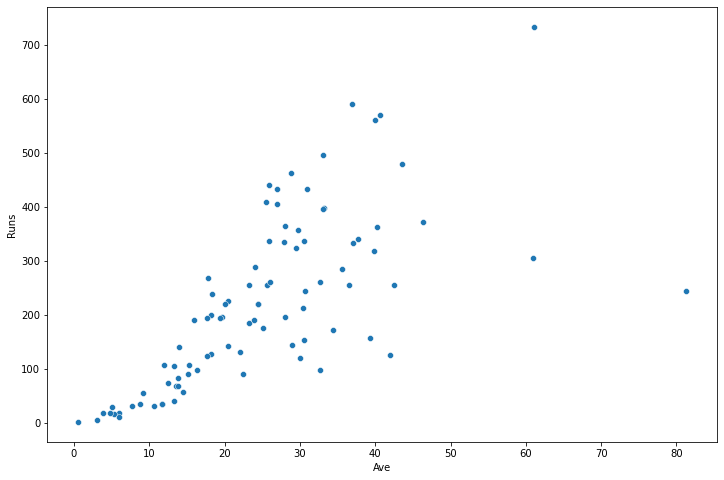

In [107]:
plt.figure(figsize=(12,8))
sns.scatterplot(df4_copy['Ave'],df4_copy['Runs'])
# It dosent show a good correlation but whereas it should be the best correlation for runs on board.

# What we see is the average runs scored and their comparitive Total runs. This cannot be explained clearly until the total number of matches played is present.

# A player could have high average runs(50)  but might have played only fewer matches (5) which leads to having lower runs (250) 

# whereas on the other hand a player with comparitively low average (45) who played more number of matches (15) will definetly have higher runs (675)

# So without number of matches played column we will not be able to deduce the better player, this can be generated using Average runs and Runs.

# No of Matches = Total Runs / Average runs

# This cant be an actual number of matches but it can be an approximate number

In [108]:
def noofmatches(x,y):
    return int(x/y)

df4_copy['NoOfMatches'] =df4_copy.apply(lambda x : noofmatches(x['Runs'],x['Ave']),axis=1)

In [18]:
df4_copy[df4_copy['Name']== 'CH Gayle']

,Name,Runs,Ave,SR,Fours,Sixes,HF,NoOfMatches
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,12


In [241]:
names=  df4_copy['Name'].unique()

In [242]:
names

array(['CH Gayle', 'G Gambhir', 'V Sehwag', 'CL White', 'S Dhawan',
       'AM Rahane', 'KP Pietersen', 'RG Sharma', 'AB de Villiers',
       'JP Duminy', 'DA Warner', 'SR Watson', 'F du Plessis', 'OA Shah',
       'DJ Bravo', 'DJ Hussey', 'SK Raina', 'AT Rayudu', 'Mandeep Singh',
       'R Dravid', 'DR Smith', 'M Vijay', 'SPD Smith', 'TM Dilshan',
       'RV Uthappa', 'SE Marsh', 'KA Pollard', 'DMD Jayawardene',
       'V Kohli', 'MA Agarwal', 'SR Tendulkar', 'MEK Hussey', 'JH Kallis',
       'MS Dhoni', 'MS Bisla', 'JD Ryder', 'BJ Hodge', 'NV Ojha',
       'DB Das', 'AC Gilchrist', 'BB McCullum', 'IK Pathan',
       'Azhar Mahmood', 'MK Pandey', 'S Badrinath', 'DA Miller',
       'MK Tiwary', 'JA Morkel', 'LRPL Taylor', 'M Manhas',
       'DT Christian', 'RA Jadeja', 'JEC Franklin', 'KC Sangakkara',
       'Y Nagar', 'STR Binny', 'SS Tiwary', 'KD Karthik', 'AL Menaria',
       'PA Patel', 'SC Ganguly', 'YK Pathan', 'Harbhajan Singh',
       'RE Levi', 'LR Shukla', 'Y Venugopal Rao', 

In [109]:
from sklearn.decomposition import PCA

In [217]:
pca = PCA(n_components=1)

In [221]:
pca_rankings = pca.fit_transform(df4_copy.drop('Name',axis=1))
rank_df = pd.DataFrame(pca_rankings,columns=['Dimension_reduced_score'])


In [222]:
rank_df
#reduced dimensionality and created numbers in single column

,Dimension_reduced_score
0,517.775774
1,373.621334
2,280.078243
3,262.436972
4,351.429869
...,...
85,-212.816826
86,-205.843577
87,-195.580617
88,-220.582871


In [232]:
a = df4_copy['Name']

In [228]:
df4_copy.dropna(axis=0, inplace=True)

In [243]:
rank_df['Names'] = names

In [244]:
rank_df

,Dimension_reduced_score,Names
0,517.775774,CH Gayle
1,373.621334,G Gambhir
2,280.078243,V Sehwag
3,262.436972,CL White
4,351.429869,S Dhawan
...,...,...
85,-212.816826,Z Khan
86,-205.843577,WD Parnell
87,-195.580617,PC Valthaty
88,-220.582871,RP Singh


In [246]:
rank_df.sort_values('Dimension_reduced_score',ascending=False)

,Dimension_reduced_score,Names
0,517.775774,CH Gayle
1,373.621334,G Gambhir
4,351.429869,S Dhawan
5,343.581411,AM Rahane
2,280.078243,V Sehwag
...,...,...
86,-205.843577,WD Parnell
84,-208.167650,A Mishra
85,-212.816826,Z Khan
88,-220.582871,RP Singh


,Dimension_reduced_score,Names
0,517.775774,CH Gayle
1,373.621334,G Gambhir
2,280.078243,V Sehwag
3,262.436972,CL White
4,351.429869,S Dhawan
...,...,...
85,-212.816826,Z Khan
86,-205.843577,WD Parnell
87,-195.580617,PC Valthaty
88,-220.582871,RP Singh


In [247]:
df4_copy11 = rank_df.pivot_table(columns='Names',values=['Dimension_reduced_score'])

In [258]:
df4_copy11

Names,A Ashish Reddy,A Mishra,AB de Villiers,AC Gilchrist,AD Mathews,AL Menaria,AM Rahane,AT Rayudu,Azhar Mahmood,B Kumar,...,STR Binny,Shakib Al Hasan,TM Dilshan,V Kohli,V Sehwag,WD Parnell,Y Nagar,Y Venugopal Rao,YK Pathan,Z Khan
Dimension_reduced_score,-185.83952,-208.16765,103.015561,-46.868917,-94.082908,-1.483872,343.581411,114.009878,-33.145223,-182.13831,...,-128.897413,-129.450909,65.471545,143.635932,280.078243,-205.843577,-67.109158,-89.564113,-27.250814,-212.816826


In [249]:
Gayle_user_ratings = df4_copy11['CH Gayle']
#Gayle has the highest number of runs so we take him as the rank 1 and we find the correlations of other player with
#him

In [261]:
rank_df.sort_values('Dimension_reduced_score',ascending=False)
#This the ranking for all players ranked in order, We have used all the features to compute a single feature and
# used it to compute the rankings

,Dimension_reduced_score,Names
0,517.775774,CH Gayle
1,373.621334,G Gambhir
4,351.429869,S Dhawan
5,343.581411,AM Rahane
2,280.078243,V Sehwag
...,...,...
86,-205.843577,WD Parnell
84,-208.167650,A Mishra
85,-212.816826,Z Khan
88,-220.582871,RP Singh


# Part 5

# List down all possible dimensionality reduction techniques that can be implemented using python.

### 1. If there are more missing values in a column and they are of not much importance in predicting the target, they can be dropped instead of imputing. 
#### For eg: Say we have 7 features and 1 target with total 10000 rows of data, out of this if a column1 is missing aroung 7000 rows of data then what i do is that i drop na and pick up the rest of the data and identify the column1's importance in predicting target, also i will check the other feature if they carry better prediction details and if column1 has very less predicting power then i would remove that column instead of imputing as imputing with mean, median will definetly reduce the variance in data and would completely change the model. Its better to remove the column if there is more than 50% of data missing and the predicting power is also low


### 2. If i am working on a linear model and i have multiple columns that contribute to the prediction then we will definetly face multicollinearity problem. In that case we can drop some columns.
#### For eg: If there is a dataset with 7 feature and 1 continuous target variable, say all 7 feature contribute to the targe (ie) correlation is either high positive or high negative, in that case i would prefer to check the Variation inflation factor VIF of columns and those which have high VIF or those columns that correlate with other columns the best will be dropped. In other words the high multi collinear columns will be dropped and only few will be kept.


### 3. Using PCA Principal Component Analysis for dimensionality reduction, in this method we have the independence to choose the number of columns we would like to have. We can create Principal components with the number of columns as  per our wish and depending on the amount of variance explained by each eigen values we can pick specific number of principal components to make prediction. Usually principal component analysis reduces the multicollinearity problem, Curse of dimensionality problem, reduces the noise in data so it is the best in dimensionality reduction.

### 4. RFC Random forest classifiers: This algorithm comes with the feature importance attribute, once you fit a set of data to RFC then you will be able to identify the feature importance and those columns that have least importance can be dropped and not used. This is also one of a good dimensionality reduction technique after PCA.

### 5. By google, i got to know the Linear Discriminant Analysis (LDA) Generalized Discriminant Analysis (GDA) also being a dimensionality reduction techniques but havent understood the concepts.

# So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

In [169]:
from sklearn.datasets import load_digits
digits = load_digits()
digits.images.shape

#Images come in multiple dimensions  as shown below, it is 3 dimensional 1797 x 8 x 8 dimensions

(1797, 8, 8)

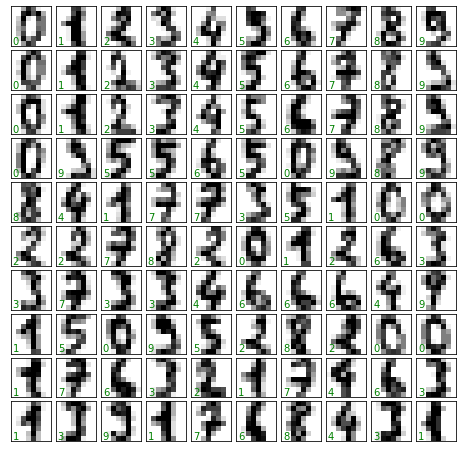

In [170]:
fig, axes = plt.subplots(10, 10, figsize=(8, 8),
subplot_kw={'xticks':[], 'yticks':[]},
gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i,ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(digits.target[i]),
    transform=ax.transAxes, color='green')
    
    
# We can see the images as shown below but this could take more computational time as it is 8 dimensions

In [188]:
pca1 = PCA(n_components=4)
pca1.fit(digits.data)
data_projected = pca1.fit_transform(digits.data)
data_projected.shape

#So, we apply PCA to convert it to 4 dimensions, post this we can still use this to make predictions

(1797, 4)

# Since images are RGB type with multiple dimensions, they usually take more storage and are highly complex as well due to higher dimensions.

# We can use PCA to reduce the dimensions even more lesser and then post this the image might look even more pixelated but it will be clear enough for  us to identify the right numbers

# Since  i do not have any idea on text, image or video preprocessing, i could not provide any more extra information. I have used this data as per the mentor session and i have understood the concept but implementing is a bit tougher since i have not idea on it.